Author : Vivek Praharsha

## System Design (High Level Overview)

Certainly! A search engine consists of several key components or modules that work together to process user queries, retrieve relevant information, and present results. Here's a high-level overview of the main components:

### 1. Web Crawling Component
- **Function**: This module is responsible for discovering and fetching content from the web (or specific databases in the case of academic search engines). It uses web crawlers (bots) to navigate through links and gather data from various sources.
- **Output**: Raw data collected from websites or documents.

### 2. Indexing Component
- **Function**: After crawling, the raw data is processed and organized into an index. This index allows for fast retrieval of information by creating a structured representation of the content (e.g., inverted index).
- **Output**: An indexed database that maps keywords to their locations within documents.

### 3. Query Processing Component
- **Function**: This module handles user input, including parsing and normalizing queries (e.g., tokenization, stop word removal). It may also involve expanding queries with synonyms or related terms.
- **Output**: A processed query ready for execution against the indexed data.

### 4. Search User Interface Component
- **Function**: The front-end interface where users input their queries and view results. It includes features like search bars, filters, sorting options, and result displays.
- **Output**: User-friendly interaction for submitting queries and displaying results.

### 5. Query Execution Component
- **Function**: This module takes the processed query and executes it against the indexed database to retrieve relevant documents based on matching criteria.
- **Output**: A set of candidate documents that match the user's query.

### 6. Ranking Algorithm Component
- **Function**: After retrieving candidate documents, this component ranks them based on relevance using algorithms that consider various factors such as keyword frequency, document quality, user engagement metrics, semantic similarity (in semantic search), etc.
- **Output**: A ranked list of documents tailored to user intent.

### 7. Results Presentation Component
- **Function**: This module formats and presents ranked results back to users in a clear manner—often including titles, snippets (summaries), links to full texts, etc.
- **Output**: A visually appealing display of search results for users.

### 8. Feedback Mechanism/Analytics Module
- **Function**: Collects user interactions with search results (clicks, dwell time) to analyze performance metrics like click-through rates or satisfaction levels; this feedback can be used for continuous improvement.
- **Output**: Data insights that inform adjustments in ranking algorithms or indexing strategies.

### Summary Diagram

```
User Input → [Search User Interface] 
               ↓ 
        [Query Processing] 
               ↓ 
        [Query Execution] 
               ↓ 
      [Ranking Algorithm] 
               ↓ 
     [Results Presentation]
               ↑  
       [Feedback Mechanism]
```

Each component plays a vital role in ensuring that users receive relevant information quickly and efficiently while providing opportunities for continuous improvement based on user behavior analysis. Together they form a cohesive system designed to optimize both retrieval speed and accuracy in response to user queries.

## Data Collection

In the context of a document retrieval search engine, particularly one that uses NLP techniques to retrieve papers from a database like arXiv, the user input and output would look as follows:

### User Input

1. **Search Query**: The user would enter a specific query related to their interest in research papers. This could be:
   - A keyword or phrase (e.g., "machine learning")
   - A specific topic (e.g., "deep learning algorithms")
   - A question (e.g., "What are the latest advancements in natural language processing?")
   - Filters for categories or types of documents (e.g., "cs.LG" for machine learning papers)

2. **Optional Filters**: Users might also have options to specify additional filters such as:
   - Date range (e.g., "last year", "2023")
   - Author name
   - Specific journals or conferences

### Example User Input
- **Query**: `"deep learning"`
- **Filters**: 
  - Category: `cs.LG`
  - Date Range: `2023`

### Output

The output from the search engine would typically include:

1. **List of Relevant Papers**:
   Each entry in the list would include key information about each paper, such as:
   - Title of the paper
   - Authors
   - Abstract or summary
   - Publication date
   - Link to access/download the paper

2. **Ranking Information**:
    The results may be ranked based on relevance scores, with more relevant papers appearing at the top.

3. **Pagination Controls**:
    If there are many results, pagination controls might be included to navigate through pages of results.

### Example Output

```
Search Results for "deep learning" in category cs.LG:

1. Title: "Advancements in Deep Learning Techniques"
   Authors: John Doe, Jane Smith
   Abstract: This paper discusses recent advancements in deep learning techniques...
   Published on: January 15, 2023
   [Read More](https://arxiv.org/abs/1234.56789)

2. Title: "Deep Learning for Natural Language Processing"
   Authors: Alice Johnson, Bob Brown
   Abstract: In this work, we explore deep learning applications in NLP...
   Published on: February 10, 2023
   [Read More](https://arxiv.org/abs/9876.54321)

3. Title: "A Survey on Deep Learning Architectures"
    Authors: Charlie White et al.
    Abstract: This survey provides an overview of various deep learning architectures...
    Published on March 5, 2023
    [Read More](https://arxiv.org/abs/1122.33445)

[Next Page]
```

### Summary

In summary, users input queries related to their research interests and receive structured outputs that provide them with relevant academic papers along with essential details about each paper for further exploration and reading.


arXiv is primarily focused on preprints in fields like physics, mathematics, computer science, and more. In contrast, Semantic Scholar covers a broader range of scientific literature over published papers

To create a dataset for the document retrieval project focused on arXiv papers, the dataset should include several key columns that capture essential information about each paper. Here are the recommended columns:

### Recommended Dataset Columns

1. **Title**: The title of the paper.
2. **Authors**: A list of authors who contributed to the paper.
3. **Abstract**: A brief summary of the paper's content.
4. **Published Date**: The date when the paper was published.
5. **Category**: The arXiv category under which the paper is classified (e.g., cs.LG).
6. **arXiv ID**: A unique identifier for each paper on arXiv (e.g., 1234.56789).
7. **PDF Link**: A direct link to download or view the PDF version of the paper.

### Modified Code to Scrape and Create a Dataset

Below is an updated version of the previous code that scrapes this information and creates a dataset in CSV format using `pandas`.

```python
import requests
import xml.etree.ElementTree as ET
import pandas as pd

def fetch_arxiv_papers(category, max_results=10):
    # Define the base URL for the arXiv API
    base_url = "http://export.arxiv.org/api/query?"
    
    # Construct the query string
    query = f"search_query=cat:{category}&start=0&max_results={max_results}"
    
    # Make a request to the arXiv API
    response = requests.get(base_url + query)
    
    if response.status_code == 200:
        # Parse XML response
        root = ET.fromstring(response.content)
        
        # List to hold extracted data
        papers_data = []
        
        for entry in root.findall('{http://www.w3.org/2005/Atom}entry'):
            title = entry.find('{http://www.w3.org/2005/Atom}title').text.strip()
            authors = ', '.join(author.find('{http://www.w3.org/2005/Atom}name').text.strip() 
                                for author in entry.findall('{http://www.w3.org/2005/Atom}author'))
            abstract = entry.find('{http://www.w3.org/2005/Atom}summary').text.strip()
            published_date = entry.find('{http://www.w3.org/2005/Atom}published').text.strip()
            arxiv_id = entry.find('{http://arxiv.org/schemas/arxiv}id').text.split('/')[-1]
            pdf_link = f"https://arxiv.org/pdf/{arxiv_id}.pdf"
            
            papers_data.append({
                'Title': title,
                'Authors': authors,
                'Abstract': abstract,
                'Published Date': published_date,
                'Category': category,
                'arXiv ID': arxiv_id,
                'PDF Link': pdf_link
            })
        
        return papers_data
    else:
        print(f"Error fetching data: {response.status_code}")
        return []

# Example usage:
if __name__ == "__main__":
    category = "cs.LG"  # Change this to your desired category (e.g., "cs.LG" for Machine Learning)
    max_results = 10
    
    papers_list = fetch_arxiv_papers(category, max_results)
    
    # Create a DataFrame from scraped data and save it as CSV
    df_papers = pd.DataFrame(papers_list)
    
    if not df_papers.empty:
        df_papers.to_csv('arxiv_papers.csv', index=False)
        print("Dataset created successfully with scraped papers.")
```

### Explanation of Modifications

1. **Data Structure**: Instead of returning just titles, we now collect all relevant information into dictionaries and append them to a list (`papers_data`).

2. **Pandas Integration**: We use `pandas` to create a DataFrame from our list of dictionaries, which allows us to easily manipulate and save our data.

3. **CSV Output**: After scraping, we save our DataFrame as a CSV file named `arxiv_papers.csv`, making it easy to access later.

4. **PDF Links and IDs**: We added logic to extract both PDF links and unique identifiers (arXiv IDs) for each paper.

### Note:
- Ensure you have installed `pandas` by running `pip install pandas`.
- You can adjust `max_results` based on how many results you want from your search query.
- This code will generate a CSV file containing all specified columns with relevant data about each scraped paper from arXiv based on your input category.


https://arxiv.org/category_taxonomy

In [19]:
import requests
import xml.etree.ElementTree as ET
import pandas as pd
import time

In [20]:
def fetch_arxiv_papers(category, max_results=10):
    # Define the base URL for the arXiv API
    base_url = "http://export.arxiv.org/api/query?"
    
    # Construct the query string
    query = f"search_query=cat:{category}&start=0&max_results={max_results}"
    
    # Make a request to the arXiv API
    response = requests.get(base_url + query)
    
    if response.status_code == 200:
        # Parse XML response
        root = ET.fromstring(response.content)
        
        # List to hold extracted data
        papers_data = []
        
        for entry in root.findall('{http://www.w3.org/2005/Atom}entry'):
            title = entry.find('{http://www.w3.org/2005/Atom}title').text.strip()
            authors = ', '.join(author.find('{http://www.w3.org/2005/Atom}name').text.strip() 
                                for author in entry.findall('{http://www.w3.org/2005/Atom}author'))
            abstract = entry.find('{http://www.w3.org/2005/Atom}summary').text.strip()
            published_date = entry.find('{http://www.w3.org/2005/Atom}published').text.strip()
            arxiv_id = entry.find('{http://www.w3.org/2005/Atom}id').text.split('/')[-1]
            pdf_link = f"https://arxiv.org/pdf/{arxiv_id}.pdf"
            
            papers_data.append({
                'Title': title,
                'Authors': authors,
                'Abstract': abstract,
                'Published Date': published_date,
                'Category': category,
                'Source': 'arXiv',
                'ID': arxiv_id,
                'PDF Link': pdf_link
            })
        
        return papers_data
    else:
        print(f"Error fetching data: {response.status_code}")
        return []

'''
# Example usage:
if __name__ == "__main__":
    categories = ["cs.LG", "cs.CV", "cs.GT"]  # Change this to your desired category (e.g., "cs.LG" for Machine Learning)
    max_results = 100
    total_papers_list = []
    
    for category in categories:
        papers_list = fetch_arxiv_papers(category, max_results)
        total_papers_list.extend(papers_list)
    
    # Create a DataFrame from scraped data and save it as CSV
    df_papers = pd.DataFrame(total_papers_list)
    
    if not df_papers.empty:
        df_papers.to_csv('arxiv_papers.csv', index=False)
'''

'\n# Example usage:\nif __name__ == "__main__":\n    categories = ["cs.LG", "cs.CV", "cs.GT"]  # Change this to your desired category (e.g., "cs.LG" for Machine Learning)\n    max_results = 100\n    total_papers_list = []\n    \n    for category in categories:\n        papers_list = fetch_arxiv_papers(category, max_results)\n        total_papers_list.extend(papers_list)\n    \n    # Create a DataFrame from scraped data and save it as CSV\n    df_papers = pd.DataFrame(total_papers_list)\n    \n    if not df_papers.empty:\n        df_papers.to_csv(\'arxiv_papers.csv\', index=False)\n'

In [ ]:
# Define a mapping of broader fields to arXiv categories
field_to_categories = {
    "Computer Science": ["cs.LG", "cs.CV", "cs.GT", "cs.AI"],
    "EESS": ["eess.AS", "eess.SP", "eess.IV", "eess.SY"],
    "Mathematics": ["math.AC", "math.GM", "math.PR", "math.ST"],
    "Quantitative Biology": ["q-bio.NC", "q-bio.GN"],
    "Statistics": ["stat.AP", "stat.CO", "stat.ML", "stat.OT", "stat.TH"],
}

# Specify the fields you're interested in
fields = ["Computer Science", "Mathematics", "Quantitative Biology", "Statistics"]  # Change this to your desired fields  # Change this to your desired category (e.g., "cs.LG" for Machine Learning)
max_results = 2500
total_papers_list = []

for field in fields:
    if field in field_to_categories:
        categories = field_to_categories[field]
        for category in categories:
            papers_list = fetch_arxiv_papers(category, max_results)
            total_papers_list.extend(papers_list)

# Create a DataFrame from scraped data and save it as CSV
df_papers = pd.DataFrame(total_papers_list)

if not df_papers.empty:
    df_papers.to_csv('arxiv_scraped_papers.csv', index=False)

In [ ]:
df_papers[0:2500]

In [ ]:
df_papers.shape

In [ ]:
# https://api.semanticscholar.org/graph/v1/paper/search/bulk?query=machine%20learning&fields=title,year,abstract,url,authors.name,fieldsOfStudy,publicationDate
def search_semantic_scholar(query, max_results=10):
    #url = f"https://api.semanticscholar.org/graph/v1/paper/search/bulk?query={query}&fields=title,year,abstract,url,authors.name,fieldsOfStudy,publicationDate&limit={max_results}"
    url = f"https://api.semanticscholar.org/graph/v1/paper/search/bulk?query={query}&fields=title,year,abstract,url,authors.name,fieldsOfStudy,publicationDate"
    response = requests.get(url)
    
    if response.status_code == 200:
        results = response.json().get('data', [])
        return results
    else:
        print(f"Error searching papers: {response.status_code}")
        return []

def fetch_paper_details(paper_id):
    url = f"https://api.semanticscholar.org/graph/v1/paper/{paper_id}?fields=title,year,abstract,url,authors.name,fieldsOfStudy"
    response = requests.get(url)
    
    if response.status_code == 200:
        paper_data = response.json()
        
        # Extracting required fields
        title = paper_data.get('title')
        authors = [author['name'] for author in paper_data.get('authors', [])]
        abstract = paper_data.get('abstract')
        published_date = paper_data.get('year')  # Year is available; full date may require additional parsing.
        
        category_list = paper_data.get('fieldsOfStudy', [])
        category = ', '.join(category_list) if isinstance(category_list, list) else ''
        
        semantic_id = paper_data.get('paperId')
        
        pdf_link = None  # The URL field may not directly provide a PDF link.
        
        return {
            'Title': title,
            'Authors': ', '.join(authors),
            'Abstract': abstract,
            'Published Date': published_date,
            'Category': category,
            'ID': semantic_id,
            'Source': 'Semantic Scholar',
            'PDF Link': pdf_link
        }
    else:
        print(f"Error fetching data for {paper_id}: {response.status_code}")
        return None

# Function to create or append data to CSV file
def save_to_csv(data, filename='ss.csv'):
    df_new_papers = pd.DataFrame(data)
    
    try:
        #df_existing_papers = pd.read_csv(filename)
        
        # Append new papers only if they are not already present based on SemanticScholar ID.
        #df_combined_papers = pd.concat([df_existing_papers, df_new_papers]).drop_duplicates(subset=['ID'], keep='last')
         
        #df_combined_papers.to_csv(filename, index=False)
        df_new_papers.to_csv(filename, index=False)
    except FileNotFoundError:
        # If file does not exist, create it.
        df_new_papers.to_csv(filename, index=False)



In [ ]:
tl = total_new_articles_list

In [ ]:
len(tl)

In [ ]:
len(total_new_articles_list)

In [ ]:
# Main execution flow 
search_query_list = ["machine learning"]
max_results_per_query = 10

total_new_articles_list = []

for query in search_query_list:
    found_articles = search_semantic_scholar(query=query.strip(), max_results=max_results_per_query)
    
    for article in found_articles:
       details_dict=fetch_paper_details(article['paperId'])
       if details_dict is not None: 
           total_new_articles_list.append(details_dict)
           
       # Sleep after fetching each article's details to avoid hitting rate limits
       time.sleep(20)  # Adjust sleep duration as needed (e.g., 1 second)

# Save or append new articles to CSV file.
if total_new_articles_list:
   save_to_csv(total_new_articles_list)

#print("Data has been saved/updated successfully.")

In [ ]:
df_sx = pd.read_csv('/kaggle/working/ss.csv')

In [ ]:
df_ss = pd.read_csv('/kaggle/working/scraped_papers.csv')

In [ ]:
df_ss

In [ ]:
df_papers.head(499)

In [ ]:
df_papers.shape

In [ ]:
import json
r3 = requests.get('https://api.semanticscholar.org/datasets/v1/release/latest/dataset/abstracts').json()
print(json.dumps(r3, indent=2))

In [ ]:
import time

OpenAlex scraping

In [ ]:
def search_openalex(keyword, page=1):
    # Define the base URLs for OpenAlex API
    works_url = f"https://api.openalex.org/works?filter=title.search:{keyword}&page={page}"

    concepts_url = f"https://api.openalex.org/concepts?filter=default.search:{keyword}&page={page}"
    
    # Set up parameters for the search query
    '''
    params = {
        'filter': f'title.search:"{keyword}"',
        'page_size': 200,  # Adjust page size as needed (max is typically 200)
        'page': page
    }
    '''
    '''
    headers = {
        'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36',
        'Accept': 'application/json',
        'Accept-Language': 'en-US,en;q=0.9',
        'Connection': 'keep-alive'
    }
    '''
    
    response1 = requests.get(works_url)

    response2 = requests.get(concepts_url)
    
    if response1.status_code == 200 and response2.status_code == 200:
        return response1.json(), response2.json()
    else:
        print(f"Error: {response1.status_code} and {response2.status_code}")
        return {}, {}

def extract_data(works):
    extracted_data = []
    
    for work in works['results']:
        # Safely get authors, handling cases where 'authorships' might be empty or missing

        authors = []
        
        if 'authorships' in work and isinstance(work['authorships'], list):
            for author in work['authorships']:
                # Check if 'author' and 'display_name' keys exist
                if 'author' in author and 'display_name' in author['author']:
                    authors.append(author['author']['display_name'])
        
        paper_info = {
            'Title': work.get('title', ''),
            'Authors': ', '.join(authors),  # Join authors into a single string
            'Abstract': work.get('description', ''),
            'Published Date': work.get('created_date', ''),
            # Adjust category extraction based on available fields
            'Category': ', '.join([concept['wikidata'] for concept in work.get('concepts', [])]),
            # Extract arXiv ID if available
            "DOI": work.get("doi", ""),  # DOI is a common identifier for published articles
            "Other Identifiers": ', '.join([f"{key}: {value}" for key, value in work.get('ids', {}).items() if key != 'arxiv']),
            # Extract PDF link if available
            'PDF Link': work['id']
        }
        
        extracted_data.append(paper_info)
    
    return extracted_data

In [ ]:
works_url = f"https://api.openalex.org/works?filter=title.search:'{keyword}'&page={page_number}"

concepts_url = f"https://api.openalex.org/concepts?filter=default.search:{keyword}&page={page_number}"

response1 = requests.get(works_url)

response2 = requests.get(concepts_url)

resp1 = response1.json()
resp2 = response2.json()

resp1_results = resp1['results']

resp2_results = resp2['results']

resp1_results.extend(resp2['results'])

In [ ]:
resp2_results

In [ ]:
resp1_results[0].keys()

In [ ]:
page_number

In [ ]:
resp2['results'][0]['description']

In [ ]:
resp[0]

In [ ]:
resp[0]['description']

In [ ]:
resp[3]['primary_topic']['subfield']['display_name']

In [ ]:
resp[0]['wikidata']

In [ ]:
keyword = "machine learning"  # Replace with your desired keyword or phrase

all_papers_data = []

page_number = 1

while True:
    # Search OpenAlex and get results
    works_json, concepts_json = search_openalex(keyword, page_number)
    
    if (works_json and works_json['results']) and (concepts_json and concepts_json['results']):
        # Extract relevant information from the results
        papers_data_work = extract_data(works_json)
        #all_papers_data.extend(papers_data_work)

        papers_data_concepts = extract_data(concepts_json)

        papers_data = papers_data_work + papers_data_concepts
        
        all_papers_data.extend(papers_data)

        # Increment page number for next request
        page_number += 1
        
        # Sleep to respect rate limits (10 requests per second means we wait at least 0.1 seconds)
        time.sleep(0.1)
    else:
        break
    '''
    if concepts_json and concepts_json['results']:
        # Extract relevant information from the results
        papers_data_concepts = extract_data(concepts_json)
        all_papers_data.extend(papers_data_concepts)

        # Increment page number for next request
        page_number += 1
        
        # Sleep to respect rate limits (10 requests per second means we wait at least 0.1 seconds)
        time.sleep(0.1)
    '''

# Create a DataFrame and save it to CSV or any other format you prefer
df_alex = pd.DataFrame(all_papers_data)

# Save to CSV file (you can change the filename as needed)
df_alex.to_csv("openalex_papers.csv", index=False)

In [ ]:
works_json

In [ ]:
page_number = 1

In [ ]:
works_json, concepts_json = search_openalex(keyword, page_number)

In [ ]:
found = 0

for i in works_json['results']:
    print(i['id'])
    for j in concepts_json['results']:
        print(f"j id :{j['id']}")
        if i['id'] == j['id']:
            found += 1
            print(i['id'])
            print(f"found, count : {found}")

In [ ]:
found

In [ ]:
concepts_json

In [ ]:
works_json['results'][0]['id']

In [ ]:
df_alex

In [ ]:
from datasets import load_dataset

dx = load_dataset("AlgorithmicResearchGroup/arxiv_s2orc_parsed", split="train", streaming=True)

In [ ]:
from datasets import load_dataset

dx_s2orc = load_dataset("leminda-ai/s2orc_small", split="train", streaming=True, trust_remote_code=True)

In [ ]:
dx_samples = []

for i, sample in enumerate(dx_s2orc):
    if i < 890000:
        dx_samples.append(sample)
    else:
        break

dx_pd = pd.DataFrame(dx_samples)

In [ ]:
dx_pd

In [ ]:
dx_pd['fieldsOfStudy']

In [ ]:
dx_exploded = dx_pd.explode('fieldsOfStudy')
dx_exploded['fieldsOfStudy'].unique()

In [ ]:
set(value for sublist in dx_pd['fieldsOfStudy'] for value in sublist)

In [ ]:
fields = ['Computer Science', 'Mathematics', 'Biology']
key_words = ['machine learning', 'statistics', 'quantitative biology'] # case insensitive
#dx_filtered = dx_pd[dx_pd['fieldsOfStudy'].apply(lambda x: any(field in x for field in fields))]
dx_filtered = dx_pd[dx_pd.apply(
    lambda row: (
        any(field in row['fieldsOfStudy'] for field in fields) or
        (isinstance(row['fieldsOfStudy'], list) and len(row['fieldsOfStudy']) == 0)
        #and 
        #any(keyword in row['title'].lower() for keyword in key_words)
        ), axis=1)]

In [ ]:
dx_cleaned = dx_filtered[['title', 'authors', 'paperAbstract', 'year', 'fieldsOfStudy', 's2Url', 'doi', 'pdfUrls']]

In [ ]:
dx_cleaned.rename(columns={'title': 'Title', 'authors': 'Authors', 'paperAbstract': 'Abstract', 'year': 'Published Date', 'fieldsOfStudy': 'Category', 's2Url': 'Source', 'doi': 'ID', 'pdfUrls': 'PDF Link'}, inplace=True)

In [ ]:
dx_cleaned

In [ ]:
!ls /kaggle/working

In [ ]:
import os
os.chdir(r'/kaggle/working')
from IPython.display import FileLink
FileLink(r'abstract_embeds_output1.csv')

In [ ]:
dx_cleaned.to_csv('semantic_scholars.csv', index=False)

In [ ]:
dx_cleaned['Category'].value_counts()

In [ ]:
df_combined = pd.concat([df_papers, dx_cleaned])

In [ ]:
df_combined.to_csv('combined.csv', index=False)

In [ ]:
import dask.dataframe as dd

In [2]:
import pandas as pd

In [3]:
df_combined = pd.read_csv('/kaggle/input/s2orc-arxiv-scraped/combined_cleaned.csv', low_memory=False)

In [ ]:
df_combined = dd.read_csv('/kaggle/input/s2orc-arxiv-scraped/combined_cleaned.csv', low_memory=False)

In [ ]:
df_combined

In [ ]:
df_combined

Yes, Named Entity Recognition (NER) and Part-of-Speech (POS) tagging are indeed part of the broader field of information extraction. Information extraction involves identifying and extracting structured information from unstructured text, and NER specifically focuses on identifying entities such as names, dates, locations, and organizations within the text. POS tagging helps in understanding the grammatical structure of sentences, which can also aid in extracting meaningful information. Together, these techniques contribute to transforming unstructured data into a more structured format that can be analyzed further.

Yes, information extraction (IE) can be beneficial for user input in a semantic search engine. By applying techniques like Named Entity Recognition (NER) and Part-of-Speech (POS) tagging to user queries, the search engine can better understand the intent and context of the input. This understanding allows for more accurate retrieval of relevant information from a knowledge graph or database.

Using IE can enhance the semantic search experience by:

1. **Improving Query Understanding**: Extracting key entities and their relationships helps in interpreting what users are looking for.
2. **Contextual Relevance**: Identifying specific terms and their meanings allows the search engine to provide results that are more aligned with user intent.
3. **Structured Data Retrieval**: Converting unstructured queries into structured formats enables more effective searching within knowledge graphs or databases.
4. **Enhanced User Experience**: By delivering more relevant results, users are likely to have a better experience and find what they need more efficiently.

Overall, incorporating information extraction techniques into a semantic search engine can significantly improve its performance and usability.

Information extraction (IE) is primarily aimed at transforming unstructured or loosely formatted text into structured data. However, it can also be useful for structured text or sequential text in certain contexts.

1. **Structured Text**: Even if the text is already somewhat structured (like tables, lists, or forms), IE can help by extracting specific fields and normalizing the data further. For example, in a structured report, you might still want to extract key entities or relationships that are not explicitly labeled.

2. **Sequential Text**: In cases where the text follows a sequence (like time-series data or narrative descriptions), IE can help identify patterns, events, and entities over time. This can be particularly useful for tasks like event extraction or trend analysis.

In summary, while IE is most critical for unstructured data transformation, it can still add value to structured and sequential texts by enhancing clarity, normalization, and extracting additional insights that may not be immediately obvious.

In addition to Named Entity Recognition (NER), a comprehensive pre-processing pipeline for a semantic search engine should include several other steps to ensure effective understanding and retrieval of relevant documents. Here’s an overview of the key components that should be included in the pre-processing pipeline:

1. **Text Normalization**:
   - **Lowercasing**: Convert all text to lowercase to ensure uniformity.
   - **Removing Punctuation and Special Characters**: Clean the text by removing unnecessary punctuation and special characters.
   - **Handling Contractions**: Expand contractions (e.g., "don't" to "do not") for consistency.

2. **Tokenization**:
   - Split the text into individual tokens (words or phrases) for further processing.

3. **Stop Word Removal**:
   - Remove common stop words (e.g., "and," "the," "is") that may not contribute significantly to meaning but can clutter analysis.

4. **Stemming/Lemmatization**:
   - Reduce words to their base or root form (stemming) or their dictionary form (lemmatization) to unify different inflections of a word.

5. **Part-of-Speech Tagging**:
   - Identify the grammatical parts of speech for each token, which can help in understanding relationships between words.

6. **Dependency Parsing**:
   - Analyze grammatical structure and relationships between words in sentences, which helps capture context and intent more effectively.

7. **Synonym Detection/Word Embeddings**:
   - Use techniques like word embeddings (e.g., Word2Vec, GloVe) or contextual embeddings from models like BERT to understand semantic similarity between terms.

8. **Query Expansion**:
   - Expand user queries with synonyms or related terms based on domain knowledge or external thesauri, enhancing retrieval effectiveness.

9. **Intent Detection and Classification**:
   - Analyze user queries to identify intent categories, which can inform how results are retrieved and ranked based on user needs.

10. **Contextual Understanding**:
    - Utilize contextual models like BERT that capture nuances in language use, improving comprehension of user queries and document relevance.

11. **Feature Extraction/Vectorization**:
    - Convert processed text into numerical representations suitable for machine learning algorithms using methods like TF-IDF or embeddings from transformer models.

12. **Data Enrichment/Metadata Extraction**:
    - Extract additional metadata from documents such as publication date, authorship, keywords, etc., which can aid in filtering and ranking results during retrieval.

13. **Normalization of Entities & Relationships Extraction**: 
    - Normalize extracted entities across different documents by linking them with a knowledge base or ontology; extract relationships between entities when applicable for richer context understanding.
  
14. **Indexing Preparation**: 
    - Prepare processed data for indexing in a search engine database so that it can be efficiently queried later on during information retrieval processes.
  
15. **Feedback Mechanism Setup (Optional)**: 
    - Implement mechanisms for capturing user feedback on search results which can be used later for model retraining or fine-tuning purposes based on real-world usage patterns.


By incorporating these components into your pre-processing pipeline, you will enhance the semantic search engine's ability to accurately interpret user queries, retrieve relevant documents effectively, and present meaningful results tailored to users' needs.


**Task** is information retrieval

POS Tagging and Its Suitability for Structured vs. Unstructured Text
POS Tagging in Context:

Unstructured Text: POS tagging is particularly useful for unstructured text, where the grammatical structure may not be immediately clear. In such cases, understanding the roles of words (nouns, verbs, adjectives, etc.) can help in extracting meaningful information and relationships.
Structured Text (e.g., Titles and Abstracts): While titles and abstracts of research papers are more structured than typical unstructured text (like articles or social media posts), they still contain natural language that can benefit from POS tagging. BERT can handle this well because it captures contextual meanings effectively without requiring explicit POS tags for many tasks.

BERT's Capabilities:
BERT is designed to understand context in language through its transformer architecture, which allows it to consider the entire sentence rather than just individual words. This means that even without explicit POS tagging, BERT can infer relationships between words based on their context within a title or abstract.

In the context of information retrieval, particularly for a semantic search engine, steps 1 to 6 (text normalization, tokenization, stop word removal, stemming/lemmatization, part-of-speech tagging, and dependency parsing) can play varying roles depending on the specific implementation and goals of the system. Here's an analysis of their relevance:

1. **Text Normalization**:
   - **Relevance**: High
   - **Reason**: Normalizing text helps ensure consistency in how queries and documents are processed. It reduces variability due to casing or punctuation that could affect matching.

2. **Tokenization**:
   - **Relevance**: High
   - **Reason**: Tokenization is essential for breaking down text into manageable units (tokens) that can be analyzed and compared during retrieval processes.

3. **Stop Word Removal**:
   - **Relevance**: Medium to High (context-dependent)
   - **Reason**: Removing stop words can help reduce noise in the data and improve search efficiency; however, it may not always be necessary if context is important for understanding user intent.

4. **Stemming/Lemmatization**:
   - **Relevance**: Medium (context-dependent)
   - **Reason**: These techniques can help unify different forms of a word but may not be critical if using advanced models like BERT that capture contextual meanings effectively without needing stemming or lemmatization.

5. **Part-of-Speech Tagging**:
   - **Relevance**: Low to Medium
   - **Reason**: While POS tagging can provide insights into sentence structure and relationships between words, it is often not strictly necessary for basic information retrieval tasks unless fine-tuning models for specific applications where grammatical roles matter.

6. **Dependency Parsing**:
   - **Relevance**: Low to Medium
   - **Reason**: Dependency parsing helps understand relationships between words in a sentence but may not be essential for all information retrieval scenarios unless deep semantic understanding is required.

### Conclusion

While steps 1 to 6 provide valuable preprocessing capabilities that enhance understanding and processing of text data in many NLP tasks, their necessity varies based on the specific goals of your semantic search engine:

- For basic keyword-based searches or simpler implementations, some preprocessing steps might be skipped. (**Baseline**)
- For more advanced semantic search systems focused on understanding user intent deeply and retrieving contextually relevant results (as outlined in your provided process), implementing at least some of these preprocessing steps—especially normalization, tokenization, and possibly stop word removal—can significantly improve performance. (**Tuned**)
  
Ultimately, the choice of which preprocessing steps to include should align with your system's design goals regarding accuracy, efficiency, and complexity in handling user queries versus document content.

Pre-processing is not needed when using Transformer Models. It uses all of the information in a sentence, punctuation and stop-words from a wide range of perspectives by leveraging a multi-head self attention mechanism.

Certainly! Here's a detailed comparison highlighting the differences between similarity search and full-text search:

### Similarity Search

1. **Definition**: 
   - Similarity search involves finding items (such as documents, images, or vectors) that are similar to a given query based on some measure of distance or similarity (e.g., cosine similarity, Euclidean distance).

2. **Data Representation**:
   - Typically relies on vector representations of data (embeddings). For example, text can be represented as dense vectors using models like BERT or Word2Vec.

3. **Search Mechanism**:
   - Uses mathematical computations to determine how close or similar the items are to the query vector.
   - The focus is on finding items that are semantically similar rather than matching specific words.

4. **Use Cases**:
   - Commonly used in recommendation systems, image retrieval, and semantic search applications where understanding context and meaning is crucial.
   - Example: Finding documents with similar themes or topics based on their embeddings.

5. **Limitations**:
   - Does not typically support exact phrase matching or keyword-based searches.
   - May struggle with precision if the embeddings do not capture nuances effectively.

### Full-Text Search

1. **Definition**: 
   - Full-text search refers to searching through text data for specific keywords or phrases within documents.

2. **Data Representation**:
   - Operates primarily on unstructured text data without converting it into vector representations.
  
3. **Search Mechanism**:
   - Utilizes indexing techniques (like inverted indexes) to quickly locate documents containing specific terms.
   - Supports features like stemming, stop-word removal, and ranking based on term frequency-inverse document frequency (TF-IDF).

4. **Use Cases**:
   - Widely used in traditional databases and search engines for querying large volumes of textual content.
   - Example: Searching for articles containing "climate change" and returning results that match this exact phrase.

5. **Features**:
    - Supports advanced querying capabilities such as Boolean operators (AND, OR), fuzzy searches, wildcard searches, phrase matching, and counting occurrences of terms.
    - Can return results ranked by relevance based on keyword matches.

6. **Limitations**:
    - May not capture semantic meaning well; two different phrases might yield no results even if they convey similar ideas unless synonyms are explicitly indexed.
    - Less effective in scenarios where understanding context beyond keywords is necessary.

### Summary

- **Similarity Search focuses on finding semantically related items using vector representations**, making it suitable for applications requiring contextual understanding (like recommendations).
  
- In contrast, **Full-Text Search emphasizes precise keyword matching within textual content**, providing robust features for querying large datasets while being less capable of capturing nuanced meanings beyond exact matches.

Both approaches serve distinct purposes but can complement each other when integrated into systems requiring both semantic understanding and precise text retrieval capabilities!

## Indexed Database

SQLite:
Description: A lightweight disk-based database that doesn’t require a separate server process.
Integration: You can use SQLite alongside Haystack to store documents along with their embeddings.
Full-Text Search: Supports full-text search through FTS (Full-Text Search) extensions.
Kaggle Compatibility: Runs smoothly within Kaggle notebooks.

Full-text search databases are typically designed as server software. Use Haystack's native vector database with SQLite. This combination provides a seamless integration for managing embeddings and metadata. SQLite supports full-text search and can run without a dedicated server process, making them suitable for environments like Kaggle

In [ ]:
pip uninstall -y farm-haystack haystack-ai

In [3]:
!uv pip install onnxruntime --system
!uv pip install onnx --system

Using Python 3.10.12 environment at: /usr
Resolved 9 packages in 168ms                                         
⠙ Preparing packages... (0/3)                                                   
⠙ Preparing packages... (0/3)-------     0 B/84.76 KiB                  
⠙ Preparing packages... (0/3)------- 16.00 KiB/84.76 KiB                
⠙ Preparing packages... (0/3)------- 32.00 KiB/84.76 KiB                
⠙ Preparing packages... (0/3)------- 48.00 KiB/84.76 KiB                
⠙ Preparing packages... (0/3)------- 63.31 KiB/84.76 KiB                
coloredlogs ------------------------------     0 B/44.94 KiB
⠙ Preparing packages... (0/3)------- 63.31 KiB/84.76 KiB                
coloredlogs ------------------------------     0 B/44.94 KiB
⠙ Preparing packages... (0/3)--- 79.31 KiB/84.76 KiB                
coloredlogs ------------------------------     0 B/44.94 KiB
⠙ Preparing packages... (0/3)--- 84.76 KiB/84.76 KiB                
⠙ Preparing packages... (0/3)-----     0 B/44.94

In [2]:
!uv pip install farm-haystack[all-gpu] --system

Using Python 3.10.12 environment at: /usr
Audited 1 package in 148ms


In [2]:
!uv pip install haystack-ai --system

Using Python 3.10.12 environment at: /usr
Resolved 37 packages in 375ms                                        
⠙ Preparing packages... (0/12)                                                  
⠙ Preparing packages... (0/12)---     0 B/56.89 KiB                     
⠙ Preparing packages... (0/12)--- 14.84 KiB/56.89 KiB                   
h11        ------------------------------ 14.84 KiB/56.89 KiB
⠙ Preparing packages... (0/12)---     0 B/70.32 KiB                     
h11        ------------------------------ 14.84 KiB/56.89 KiB
⠙ Preparing packages... (0/12)--- 14.91 KiB/70.32 KiB                   
h11        ------------------------------ 14.84 KiB/56.89 KiB
posthog    ------------------------------ 14.91 KiB/70.32 KiB
⠙ Preparing packages... (0/12)---     0 B/71.79 KiB                     
backoff    ------------------------------     0 B/14.79 KiB
h11        ------------------------------ 14.84 KiB/56.89 KiB
posthog    ------------------------------ 14.91 KiB/70.32 KiB
⠙ Preparin

In [ ]:
!ls /var/lib/elasticsearch/elasticsearch/nodes/0/indices

In [ ]:
!pip show scikit-learn

In [ ]:
!python3 -m pip uninstall scikit-learn-intelex -y

In [2]:
!pip uninstall scikit-learn -y

Found existing installation: scikit-learn 1.2.2
Uninstalling scikit-learn-1.2.2:
  Successfully uninstalled scikit-learn-1.2.2


In [ ]:
!pip uninstall scikit-learn-intelex -y

In [ ]:
%pip uninstall sklearn -y

In [3]:
!uv pip install scikit-learn==1.5.2 --system

Using Python 3.10.12 environment at: /usr
Resolved 5 packages in 217ms                                         
⠙ Preparing packages... (0/1)                                                   
⠙ Preparing packages... (0/1)------     0 B/12.73 MiB                   
⠙ Preparing packages... (0/1)------ 16.00 KiB/12.73 MiB                 
⠙ Preparing packages... (0/1)------ 32.00 KiB/12.73 MiB                 
⠙ Preparing packages... (0/1)------ 48.00 KiB/12.73 MiB                 
⠙ Preparing packages... (0/1)------ 63.80 KiB/12.73 MiB                 
⠙ Preparing packages... (0/1)------ 79.80 KiB/12.73 MiB                 
⠙ Preparing packages... (0/1)------ 95.80 KiB/12.73 MiB                 
⠙ Preparing packages... (0/1)------ 111.80 KiB/12.73 MiB                
⠙ Preparing packages... (0/1)------ 127.80 KiB/12.73 MiB                
⠙ Preparing packages... (0/1)------ 143.80 KiB/12.73 MiB                
⠙ Preparing packages... (0/1)------ 159.80 KiB/12.73 MiB                
⠙ Pr

In [ ]:
!pip list | grep -w 'scikit-learn'

In [ ]:
!pip list | grep -w 'scikit-learn'

In [ ]:
!pip show scikit-learn

In [ ]:
!ls '/usr/local/lib/python3.10/dist-packages/sklearn'

In [ ]:
!grep -w '__version__' /usr/local/lib/python3.10/dist-packages/sklearn/__init__.py

In [3]:
import sklearn
print(sklearn.__version__)
sklearn.__file__

1.5.2


'/usr/local/lib/python3.10/dist-packages/sklearn/__init__.py'

In [ ]:
## CPU based inference

import tensorflow as tf
from transformers import BertTokenizer, TFBertModel

# Load pre-trained BERT tokenizer and model (TensorFlow version)
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = TFBertModel.from_pretrained('bert-base-uncased')

def custom_preprocess(txt):
    # Tokenization using BERT tokenizer
    tokens = tokenizer.tokenize(txt)

    # Remove stop words (you can define your own stop words list if needed)
    stop_words = set(tokenizer.all_special_tokens)  # Using special tokens as an example; customize as needed
    tokens = [token for token in tokens if token not in stop_words]

    return tokens

def create_embeddings(tokens):
    # Convert tokens to input IDs for BERT
    inputs = tokenizer(tokens, return_tensors='tf', padding=True, truncation=True)

    outputs = model(**inputs)

    # Get the embeddings from the last hidden state of BERT
    embeddings = outputs.last_hidden_state
    
    return embeddings

def process_text(txt):
    pre_proc_tokens = custom_preprocess(txt)
    
    if pre_proc_tokens:
        embeddings = create_embeddings(pre_proc_tokens)
        return pre_proc_tokens, embeddings
    
    return [], None

### GPU based inferencing

In [ ]:
!uv pip install --upgrade urllib3 --system

In [24]:
import torch
#from transformers import BertTokenizer, BertModel

from transformers import DistilBertTokenizer, DistilBertModel

from haystack.document_stores import SQLDocumentStore

# Load pre-trained DistilBERT tokenizer and model (PyTorch version)
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')
model = DistilBertModel.from_pretrained('distilbert-base-uncased')

# Load pre-trained BERT tokenizer and model (PyTorch version)
#tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
#model = BertModel.from_pretrained('bert-base-uncased')

# Move inputs to the appropriate device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model.to(device)

# Ensure the model is in evaluation mode
model.eval()

def custom_preprocess(txt):
    # Tokenization using BERT tokenizer
    tokens = tokenizer.tokenize(txt)

    # Remove stop words (you can define your own stop words list if needed)
    stop_words = set(tokenizer.all_special_tokens)  # Using special tokens as an example; customize as needed
    tokens = [token for token in tokens if token not in stop_words]

    return tokens

def create_embeddings_batch(tokens_list, print_tokens=False):
    # Print the shape and type of tokens_list
    if print_tokens == True:
        print("----- DEBUG START -----")
        print(f"Type of tokens_list: {type(tokens_list)}")
        print(f"Length of tokens_list: {len(tokens_list)}")
    
        #for i, token in enumerate(tokens_list):
            #print(f"Token {i}: {token} (Length: {len(token)})")
        print("----- DEBUG END-----")

    # Join each inner list into a single string
    joined_texts = [' '.join(tokens) for tokens in tokens_list] # tokens_list has to be a list of strings
    
    # Convert list of tokens to input IDs for BERT
    #inputs = tokenizer(joined_texts, return_tensors='pt', padding=True, truncation=True)
    inputs = tokenizer(joined_texts, return_tensors='pt', padding='max_length', max_length=1024, truncation=True)
    
    #inputs = inputs.to(device)
    
    inputs = {key: value.to(device) for key, value in inputs.items()}

    # Use autocast context manager for mixed precision inference
    with torch.no_grad():  # Disable gradient calculation for inference
        with torch.amp.autocast('cuda'):  # Enable mixed precision context manager
            outputs = model(**inputs)

    # Delete the inputs tensor to free up memory
    del inputs

    # Get the embeddings from the last hidden state of BERT.
    embeddings = outputs.last_hidden_state

    #embeddings = outputs.last_hidden_state.mean(dim=1)  # Average pooling over the sequence length

    del outputs
    
    return embeddings
'''
def process_text_batch(texts):
    pre_proc_tokens_list = [custom_preprocess(txt) for txt in texts]
    
    # Filter out empty token lists
    non_empty_tokens = [tokens for tokens in pre_proc_tokens_list if tokens]
    
    if non_empty_tokens:
         embeddings = create_embeddings_batch(non_empty_tokens)
         # Concatenate all embeddings into one tensor along dimension 0 (batch dimension)
         #concatenated_embeddings = torch.cat(embeddings, dim=0)  # Assuming they are already batched
         return [(tokens, emb) for tokens, emb in zip(non_empty_tokens, embeddings)]
    
    return [([], None)] * len(texts)
'''
def process_text_batch(texts_list):
    # texts_list is now a list of lists, where each inner list contains text from different columns
    processed_data = []
    
    for texts in texts_list:
        pre_proc_tokens_list = [custom_preprocess(txt) for txt in texts]
        
        # Filter out empty token lists
        non_empty_tokens = [tokens for tokens in pre_proc_tokens_list if tokens]
        
        if non_empty_tokens:
            embeddings = create_embeddings_batch(non_empty_tokens)
            processed_data.append((non_empty_tokens, embeddings))
        else:
            processed_data.append(([], None))  # Append empty if no valid data
    
    return processed_data

In [ ]:
# Apply batch processing on DataFrame
batch_size = 32  # Adjust based on your memory capacity
title_embeddings = []

for i in range(0, len(df_combined), batch_size):
    batch_texts = df_combined['Title'].iloc[i:i + batch_size].tolist()
    
    title_embeddings.extend(process_text_batch(batch_texts))

# Store results back into DataFrame or another structure as needed.

In [ ]:
export PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True

In [ ]:
torch.cuda.empty_cache()

In [1]:
!nvidia-smi

Sun Feb  2 07:01:27 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.35.03              Driver Version: 560.35.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   41C    P8              9W /   70W |       1MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!sudo fuser -v /dev/nvidia*

In [ ]:
!sudo kill -9 40

In [ ]:
import gc  # Import the garbage collector module

In [ ]:
abstract_embeddings = []

In [ ]:
subsets = [sets for sets in range(0, len(df_combined), 3000)]

In [ ]:
#batch_size = 4

for i in range(subsets[8], subsets[9], batch_size):
    batch_texts = df_combined['Abstract'].iloc[i:i + batch_size].tolist()
    
    # Process the texts and get embeddings
    embeddings_list = process_text_batch(batch_texts)
    
    abstract_embeddings.extend(embeddings_list)

    # Clear GPU memory after processing each batch
    #torch.cuda.empty_cache()  # Release unused memory from GPU cache

    # Delete tensors that are no longer needed
    del embeddings_list  # Delete the temporary variable holding embeddings
    
    # Optionally clear other variables if necessary
    del batch_texts
    
    # Invoke Python's garbage collector to reclaim memory
    gc.collect()

In [ ]:
batch_size = 16

In [ ]:
for i in range(subsets[0], subsets[1], batch_size):
    title = df_combined['Title'].iloc[i:i + batch_size]
    abstract = df_combined['Abstract'].iloc[i:i + batch_size]
    publication_date = df_combined['Published Date'].iloc[i:i + batch_size]
    authors = df_combined['Authors'].iloc[i:i + batch_size]

    title_id = f"title_{uuid.uuid4()}"
    abstract_id = f"abstract_{uuid.uuid4()}"

    # Process Title
    title_embedding = process_text_batch([title])
    
    # Store Title Document with hooking ID and metadata
    document_store.write_documents([{
        "document_id": title_id,
        "content": title,
        "embedding": title_embedding[0][1].numpy().tolist(),
        "type": "title",
        "publication_date": publication_date,
        "authors": authors
    }])

    # Process Abstract
    abstract_embedding = process_text_batch([abstract])
    
    # Store Abstract Document with hooking ID and metadata
    document_store.write_documents([{
        "document_id": abstract_id,
        "content": abstract,
        "embedding": abstract_embedding[0][1].numpy().tolist(),
        "type": "abstract",
        "publication_date": publication_date,
        "authors": authors
    }])

In [8]:
import os
os.getcwd()

'/kaggle/working'

In [ ]:
!uv pip install tqdm --system

In [ ]:
import uuid
from tqdm import tqdm

# Initialize the document store (SQLite)
document_store = SQLDocumentStore(url="sqlite:///indexed_database.db")

# Fix a potential issue with overlapping slices of data batches leading to repetitive entries or mismatches
for i in tqdm(range(0, len(df_combined), batch_size), desc="Processing Batches"):
    title = df_combined['Title'].iloc[i:i + batch_size].tolist()  # Convert to list
    abstract = df_combined['Abstract'].iloc[i:i + batch_size].tolist()  # Convert to list

    # Ensure both lists have corresponding entries
    assert len(title) == len(abstract), "Titles and abstracts must match in length."
    
    publication_date = df_combined['Published Date'].iloc[i:i + batch_size].tolist()  # Convert to list
    authors = df_combined['Authors'].iloc[i:i + batch_size].tolist()  # Convert to list

    # Generate a common document ID for both title and abstract
    common_id = str(uuid.uuid4())

    # Process Title
    title_embedding = process_text_batch(title)  # Process the entire batch at once
    
    # Store Title Documents with hooking ID and metadata
    document_store.write_documents([{
        "document_id": f"title_{common_id}",  # Use common_id here
        "content": str(t),
        "embedding": emb.numpy().tolist() if emb is not None else None,
        "type": "title",
        "publication_date": pub_date,
        "authors": auths,
        "common_id": common_id  # Add this field to link with abstracts
    } for (t, emb), pub_date, auths in zip(title_embedding, publication_date, authors)])

    # Process Abstract
    abstract_embedding = process_text_batch(abstract)  # Process the entire batch at once
    
    # Store Abstract Documents with hooking ID and metadata
    document_store.write_documents([{
        "document_id": f"abstract_{common_id}",  # Use same common_id here
        "content": str(a),
        "embedding": emb.numpy().tolist() if emb is not None else None,
        "type": "abstract",
        "publication_date": pub_date,
        "authors": auths,
        "common_id": common_id  # Add this field to link with titles
    } for (a, emb), pub_date, auths in zip(abstract_embedding, publication_date, authors)])

Let's do some profiling to understand bottlenecks in the code to differentiate between time spent on model computation and time spent on tensor transfers. The profiler provides detailed insights into various operations, including CPU and GPU activities, which can help identify bottlenecks in the inference process

In [ ]:
import uuid
import torch
from torch.profiler import profile, record_function, ProfilerActivity
from tqdm import tqdm

# Initialize the document store (SQLite)
document_store = SQLDocumentStore(url="sqlite:///test_database.db")

# Start profiling
with profile(activities=[ProfilerActivity.CPU, ProfilerActivity.CUDA], 
                   profile_memory=True) as prof:
    # Fix a potential issue with overlapping slices of data batches leading to repetitive entries or mismatches
    for i in tqdm(range(0, 3000, batch_size), desc="Processing Batches"):
        title = df_combined['Title'].iloc[i:i + batch_size].tolist()  # Convert to list
        abstract = df_combined['Abstract'].iloc[i:i + batch_size].tolist()  # Convert to list
        
        # Ensure both lists have corresponding entries
        assert len(title) == len(abstract), "Titles and abstracts must match in length."
        
        publication_date = df_combined['Published Date'].iloc[i:i + batch_size].tolist()  # Convert to list
        authors = df_combined['Authors'].iloc[i:i + batch_size].tolist()  # Convert to list
        
        common_id = str(uuid.uuid4())  # Generate a common document ID
        
        # Process Title Embeddings
        with record_function("Process Title Embeddings"):
            title_embedding = process_text_batch(title)  # Process embeddings
            
        # Store Title Documents with hooking ID and metadata
        with record_function("Write Title Documents"):
            document_store.write_documents([{
                "document_id": f"title_{common_id}",
                "content": str(t),
                "embedding": emb.numpy().tolist() if emb is not None else None,
                "type": "title",
                "publication_date": pub_date,
                "authors": auths,
                "common_id": common_id  
            } for (t, emb), pub_date, auths in zip(title_embedding, publication_date, authors)])
        
        # Process Abstract Embeddings
        with record_function("Process Abstract Embeddings"):
            abstract_embedding = process_text_batch(abstract)  # Process embeddings
            
        # Store Abstract Documents with hooking ID and metadata
        with record_function("Write Abstract Documents"):
            document_store.write_documents([{
                "document_id": f"abstract_{common_id}",
                "content": str(a),
                "embedding": emb.numpy().tolist() if emb is not None else None,
                "type": "abstract",
                "publication_date": pub_date,
                "authors": auths,
                "common_id": common_id  
            } for (a, emb), pub_date, auths in zip(abstract_embedding, publication_date, authors)])

# Print profiling results after exiting context manager 
print(prof.key_averages().table(sort_by="cuda_time_total", row_limit=10))

In [ ]:
import uuid
import torch
from torch.profiler import profile, record_function, ProfilerActivity
from tqdm import tqdm
from dask import delayed, compute  # Import necessary functions from Dask

# Initialize the document store (SQLite)
document_store = SQLDocumentStore(url="sqlite:///test_database.db")

# Function to process a single batch and write documents
@delayed  # This decorator allows the function to be executed lazily by Dask
def process_and_store_batch(titles_batch, abstracts_batch, publication_dates, authors):
    common_id = str(uuid.uuid4())  # Generate a common document ID
    
    # Process Title Embeddings
    with record_function("Process Title Embeddings"):
        title_embedding = process_text_batch(titles_batch)  # Process embeddings
        
    title_docs = [{
        "document_id": f"title_{common_id}",
        "content": str(t),
        "embedding": emb.numpy().tolist() if emb is not None else None,
        "type": "title",
        "publication_date": pub_date,
        "authors": auths,
        "common_id": common_id  
    } for (t, emb), pub_date, auths in zip(title_embedding, publication_dates, authors)]
    
    # Process Abstract Embeddings
    with record_function("Process Abstract Embeddings"):
        abstract_embedding = process_text_batch(abstracts_batch)  # Process embeddings
        
    abstract_docs = [{
        "document_id": f"abstract_{common_id}",
        "content": str(a),
        "embedding": emb.numpy().tolist() if emb is not None else None,
        "type": "abstract",
        "publication_date": pub_date,
        "authors": auths,
        "common_id": common_id  
    } for (a, emb), pub_date, auths in zip(abstract_embedding, publication_dates, authors)]
    
    return title_docs + abstract_docs  # Return combined results

# Start profiling
with profile(activities=[ProfilerActivity.CPU, ProfilerActivity.CUDA], 
              profile_memory=True) as prof:
    
    all_futures = []  # List to hold futures for each batch
    
    # Loop through data and create delayed tasks for each batch processing operation.
    for i in tqdm(range(0, 3000, batch_size), desc="Processing Batches"):
        
        titles_batch = df_combined['Title'].iloc[i:i + batch_size].tolist()
        abstracts_batch = df_combined['Abstract'].iloc[i:i + batch_size].tolist()
        
        # Ensure both lists have corresponding entries.
        assert len(titles_batch) == len(abstracts_batch), \
            f"Titles and abstracts must match in length at index {i}."
             
        publication_dates = df_combined['Published Date'].iloc[i:i + batch_size].tolist()
        authors_list = df_combined['Authors'].iloc[i:i + batch_size].tolist()

        future = process_and_store_batch(titles_batch=titles_batch,
                                           abstracts_batch=abstracts_batch,
                                           publication_dates=publication_dates,
                                           authors=authors_list)
         
        all_futures.append(future)

    results = compute(*all_futures)  # Execute all delayed tasks concurrently
    
    all_documents_to_write = []
    for result in results:
        all_documents_to_write.extend(result)

    with record_function("Write Documents"):
        document_store.write_documents(all_documents_to_write)

# Print profiling results after exiting context manager 
print(prof.key_averages().table(sort_by="cuda_time_total", row_limit=10))

In [20]:
import uuid
import torch
import numpy as np
from torch.profiler import profile, record_function, ProfilerActivity
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor  # Importing ThreadPoolExecutor from concurrent.futures
import onnxruntime as ort

# Initialize the document store (SQLite)
document_store = SQLDocumentStore(url="sqlite:///test_database.db")

# Set batch size and max workers for parallel processing
batch_size = 128  # Adjust as needed
max_workers = 10  # Number of batches to process in parallel

# Load your trained PyTorch model here (assuming it's already defined)
model.eval()  # Set the model to evaluation mode

# Exporting the PyTorch model to ONNX format if not done already.
max_sequence_length = tokenizer.model_max_length
vocab_size = tokenizer.vocab_size
dummy_input = torch.randint(0, vocab_size, (1, max_sequence_length)).long().to(device) # Expected input dimensions
#dummy_input = torch.randn(1, 3, 224, 224).to(device).long()
torch.onnx.export(model,
                  dummy_input,
                  "model.onnx",
                  input_names=['input'],
                  output_names=['output'],
                  dynamic_axes={'input': {0: 'batch_size', 1: 'sequence_length'}, 
                                'output': {0: 'batch_size'}})

# Load the exported ONNX model using OnnxRuntime.
ort_session = ort.InferenceSession("model.onnx")

def process_and_store_batch(titles_batch, abstracts_batch, publication_dates, authors):
    common_id = str(uuid.uuid4())  
    
    title_embedding = []
    for title in titles_batch:
        inputs_onnx = tokenizer(title)["input_ids"]
        inputs_onnx = np.array(inputs_onnx).astype(np.int64).reshape(1, -1)
        #inputs_onnx = torch.tensor(inputs_onnx).to(device)
        #inputs_onnx = torch.tensor(inputs_onnx).to(device).long()
        
        ort_inputs = {ort_session.get_inputs()[0].name: inputs_onnx}
        title_embedding.append(ort_session.run(None, ort_inputs)[0]) 
    
    title_docs = [{
        "document_id": f"title_{common_id}",
        "content": str(t),
        "embedding": emb.tolist(),
        "type": "title",
        "publication_date": pub_date,
        "authors": auths,
        "common_id": common_id  
    } for t, emb, pub_date, auths in zip(titles_batch, title_embedding,
                                         publication_dates,
                                         authors)]
    
    abstract_embedding = []
    for abstract in abstracts_batch:
        inputs_onnx = tokenizer(abstract)["input_ids"]
        inputs_onnx = np.array(inputs_onnx).astype(np.int64).reshape(1,-1)
        #inputs_onnx = torch.tensor(inputs_onnx).to(device).long()
        #inputs_onnx = torch.tensor(inputs_onnx).to(device)
        
        ort_inputs = {ort_session.get_inputs()[0].name: inputs_onnx}
        abstract_embedding.append(ort_session.run(None , ort_inputs)[0])
    
    abstract_docs = [{
         "document_id": f"abstract_{common_id}",
         "content": str(a),
         "embedding": emb.tolist(),
         "type": "abstract",
         "publication_date": pub_date,
         "authors": auths,
         "common_id": common_id  
     } for a , emb , pub_date , auths in zip(abstracts_batch , abstract_embedding ,
                                              publication_dates ,
                                              authors)]
    
    return title_docs + abstract_docs  

with profile(activities=[ProfilerActivity.CPU], 
              profile_memory=True) as prof:
    
    all_documents_to_write = []
    
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        
        futures = []  
        
        # Loop through data and submit tasks for each batch processing operation.
        for i in tqdm(range(0, 3000, batch_size), desc="Processing Batches"):
            titles_batch   = df_combined['Title'].iloc[i:i + batch_size].tolist()
            abstracts_batch= df_combined['Abstract'].iloc[i:i + batch_size].tolist()
            publication_dates= df_combined['Published Date'].iloc[i:i + batch_size].tolist()
            authors_list   = df_combined['Authors'].iloc[i:i + batch_size].tolist()

            future= executor.submit(process_and_store_batch ,
                                    titles_batch ,
                                    abstracts_batch ,
                                    publication_dates ,
                                    authors_list)
            
            futures.append(future)
            '''
            if len(futures) >= max_workers:
                completed_futures= [f.result() for f in futures if f.done()]
                all_documents_to_write.extend(completed_futures)
                futures[:] =[f for f in futures if not f.done()]  
            '''
        
       # Gather remaining results after all tasks are submitted.
        #remaining_results= [f.result() for f in futures]
        #all_documents_to_write.extend(remaining_results)

        #document_store.write_documents(all_documents_to_write)

print(prof.key_averages().table(sort_by="cuda_time_total", row_limit=10))

Processing Batches: 100%|██████████| 24/24 [00:00<00:00, 664.21it/s]


In [9]:
from torch.utils.data import Dataset
'''
class DocumentDataset(Dataset):
    def __init__(self, dataframe):
        self.dataframe = dataframe

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        title = self.dataframe['Title'].iloc[idx]
        abstract = self.dataframe['Abstract'].iloc[idx]
        publication_date = self.dataframe['Published Date'].iloc[idx]
        authors = self.dataframe['Authors'].iloc[idx]

        return title, abstract, publication_date, authors
'''
class TextEmbeddingDataset(Dataset):
    def __init__(self, dataframe, text_columns):
        self.dataframe = dataframe  # Your DataFrame containing text data
        self.text_columns = text_columns  # List of column names containing text data

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        # Extracting all relevant text from specified columns for this index
        texts = [self.dataframe[col].iloc[idx] for col in self.text_columns]
        
        # Process the batch of texts (list of lists)
        processed_data = process_text_batch([texts])  # Wrap in another list
        
        if processed_data:
            tokens, embeddings = processed_data[0]  # Get first (and only) item since we wrapped it in a list
            return tokens, embeddings
        
        return [([], None)] * len(self.text_columns)  # Return empty if no valid data

In [3]:
import multiprocessing
multiprocessing.set_start_method('spawn')

In [25]:
import uuid
import torch
import numpy as np
from torch.profiler import profile, ProfilerActivity
from torch.utils.data import DataLoader
import torch.nn as nn
from tqdm import tqdm
from concurrent.futures import ProcessPoolExecutor  # For parallel processing if needed
import onnxruntime as ort

# Wrap the model for data parallelism on two GPUs
model = nn.DataParallel(model)  # Ensure 'model' is already moved to GPU (e.g., model.to(device))

# Initialize document store (SQLite)
document_store = SQLDocumentStore(url="sqlite:///test_database.db")

# Set batch size and max workers for parallel processing
batch_size = 512  # Adjust as needed
max_workers = 10  # Number of batches to process in parallel

# Exporting the PyTorch model to ONNX format if not done already.
max_sequence_length = tokenizer.model_max_length
vocab_size = tokenizer.vocab_size
dummy_input = torch.randint(0, vocab_size, (1, max_sequence_length)).long().to(device) # Expected input dimensions
#dummy_input = torch.randn(1, 3, 224, 224).to(device).long()
torch.onnx.export(model.module,
                  dummy_input,
                  "model.onnx",
                  input_names=['input'],
                  output_names=['output'],
                  dynamic_axes={'input': {0: 'batch_size', 1: 'sequence_length'}, 
                                'output': {0: 'batch_size'}})

# Load ONNX model using OnnxRuntime.
ort_session = ort.InferenceSession("model.onnx")

# Assuming df_combined is your DataFrame containing data and DocumentDataset is defined.
text_columns = ['Title', 'Abstract', 'Published Date', 'Authors']
dataset = TextEmbeddingDataset(df_combined[0:3000], text_columns)
dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=4, pin_memory=True)

with profile(activities=[ProfilerActivity.CPU], 
              profile_memory=True) as prof:
    
    all_documents_to_write = []
    
    with ProcessPoolExecutor(max_workers=max_workers) as executor:
        futures = []  
        
        for titles_batch, abstracts_batch, publication_dates, authors_list in tqdm(dataloader,
                                                                                   desc="Processing Batches"):
            common_id = str(uuid.uuid4())  
            
            title_embedding = []
            for title in titles_batch:
                inputs_onnx = tokenizer(title)["input_ids"]
                inputs_onnx = np.array(inputs_onnx).astype(np.int64).reshape(1, -1)
                
                ort_inputs = {ort_session.get_inputs()[0].name: inputs_onnx}
                title_embedding.append(ort_session.run(None, ort_inputs)[0]) 
            
            title_docs = [{
                "document_id": f"title_{common_id}",
                "content": str(t),
                "embedding": emb.tolist(),
                "type": "title",
                "publication_date": pub_date,
                "authors": auths,
                "common_id": common_id  
            } for t, emb, pub_date, auths in zip(titles_batch, title_embedding,
                                                 publication_dates,
                                                 authors_list)]
            
            abstract_embedding = []
            for abstract in abstracts_batch:
                inputs_onnx = tokenizer(abstract)["input_ids"]
                inputs_onnx = np.array(inputs_onnx).astype(np.int64).reshape(1,-1)
                
                ort_inputs = {ort_session.get_inputs()[0].name: inputs_onnx}
                abstract_embedding.append(ort_session.run(None , ort_inputs)[0])
            
            abstract_docs = [{
                 "document_id": f"abstract_{common_id}",
                 "content": str(a),
                 "embedding": emb.tolist(),
                 "type": "abstract",
                 "publication_date": pub_date,
                 "authors": auths,
                 "common_id": common_id  
             } for a , emb , pub_date , auths in zip(abstracts_batch , abstract_embedding ,
                                                      publication_dates ,
                                                      authors_list)]
            
            all_documents_to_write.extend(title_docs + abstract_docs)

    # Save documents after processing is complete.
    document_store.write_documents(all_documents_to_write)

print(prof.key_averages().table(sort_by="cuda_time_total", row_limit=10))

Processing Batches:   0%|          | 0/6 [06:27<?, ?it/s]


KeyboardInterrupt: 

In [12]:
!uv pip install "sentence-transformers>=3.0.0" --system

Using Python 3.10.12 environment at: /usr
Resolved 29 packages in 382ms                                        
⠙ Preparing packages... (0/1)                                                   
⠙ Preparing packages... (0/1)---------------     0 B/269.43 KiB         
⠙ Preparing packages... (0/1)--------------- 14.93 KiB/269.43 KiB       
⠙ Preparing packages... (0/1)--------------- 30.93 KiB/269.43 KiB       
⠙ Preparing packages... (0/1)--------------- 46.93 KiB/269.43 KiB       
⠙ Preparing packages... (0/1)--------------- 62.93 KiB/269.43 KiB       
⠙ Preparing packages... (0/1)--------------- 78.93 KiB/269.43 KiB       
⠙ Preparing packages... (0/1)--------------- 94.93 KiB/269.43 KiB       
⠙ Preparing packages... (0/1)--------------- 110.93 KiB/269.43 KiB      
⠙ Preparing packages... (0/1)--------------- 126.93 KiB/269.43 KiB      
⠙ Preparing packages... (0/1)m-------------- 142.93 KiB/269.43 KiB      
⠙ Preparing packages... (0/1)------------ 158.93 KiB/269.43 KiB      
⠙ Prepa

In [2]:
!uv pip install haystack-ai --system

Using Python 3.10.12 environment at: /usr
Audited 1 package in 121ms


In [2]:
import pandas as pd
df_combined = pd.read_csv('/kaggle/input/s2orc-arxiv-scraped/combined_cleaned.csv', low_memory=False)

In [11]:
from haystack.components.converters.csv import CSVToDocument

converter = CSVToDocument()
results = converter.run(sources=["/kaggle/input/s2orc-arxiv-scraped/combined_cleaned.csv"])
documents = results["documents"]

In [ ]:
documents[0].content

In [4]:
df_combined.columns

Index(['Title', 'Authors', 'Abstract', 'Published Date', 'Category', 'Source',
       'ID', 'PDF Link'],
      dtype='object')

In [3]:
from haystack import Document

docs = []
for index, doc in df_combined.iterrows():
    docs.append(
        Document(content=doc["Abstract"], meta={"title": doc["Title"], "authors": doc["Authors"], "pub_date": doc["Published Date"], "category": doc["Category"], "source": doc["Source"]})
    )

In [6]:
f_doc = [fdoc for fdoc in range(len(docs)) if type(docs[fdoc].content) == float]

In [4]:
docs_valid = []
for index in range(len(docs)):
    if type(docs[index].content) is not float:
        docs_valid.append(docs[index])

In [5]:
len(docs_valid)

300574

In [9]:
len(docs)

300784

In [17]:
len(f_doc)

210

In [7]:
docs[0].content

'This paper presents the MAXQ approach to hierarchical reinforcement learning\nbased on decomposing the target Markov decision process (MDP) into a hierarchy\nof smaller MDPs and decomposing the value function of the target MDP into an\nadditive combination of the value functions of the smaller MDPs. The paper\ndefines the MAXQ hierarchy, proves formal results on its representational\npower, and establishes five conditions for the safe use of state abstractions.\nThe paper presents an online model-free learning algorithm, MAXQ-Q, and proves\nthat it converges wih probability 1 to a kind of locally-optimal policy known\nas a recursively optimal policy, even in the presence of the five kinds of\nstate abstraction. The paper evaluates the MAXQ representation and MAXQ-Q\nthrough a series of experiments in three domains and shows experimentally that\nMAXQ-Q (with state abstractions) converges to a recursively optimal policy much\nfaster than flat Q learning. The fact that MAXQ learns a repr

In [13]:
from sentence_transformers import SentenceTransformer

## Indexing Pipeline

In [5]:
from haystack import Pipeline
from haystack.components.embedders import SentenceTransformersDocumentEmbedder
from haystack.document_stores.in_memory import InMemoryDocumentStore
#from haystack.components.converters import CSVToDocument
from haystack.components.preprocessors import DocumentCleaner
from haystack.components.preprocessors import DocumentSplitter
from haystack.components.writers import DocumentWriter
from haystack.document_stores.types import DuplicatePolicy
from haystack.utils import ComponentDevice

meta = ["title", "authors", "pub_date", "category", "source"]

def indexing(embedding_model: str, chunk_size: int):
    document_cleaner = DocumentCleaner()
    
    document_splitter = DocumentSplitter(split_by="word", split_length=chunk_size)
    
    document_embedder = SentenceTransformersDocumentEmbedder(
            model=embedding_model, meta_fields_to_embed=meta, device=ComponentDevice.from_str("cuda:0")
        )
    
    document_store = InMemoryDocumentStore(embedding_similarity_function="cosine")
    
    document_writer = DocumentWriter(document_store=document_store, policy=DuplicatePolicy.OVERWRITE)
    
    indexing_pipeline = Pipeline()
    #indexing_pipeline.add_component("converter", CSVToDocument())
    indexing_pipeline.add_component("cleaner", document_cleaner)
    #pipeline.add_component("splitter", DocumentSplitter(split_by="sentence", split_length=5))
    #indexing_pipeline.add_component("splitter", document_splitter)
    indexing_pipeline.add_component("embedder", document_embedder)
    indexing_pipeline.add_component("writer", document_writer)
    #pipeline.connect("converter", "cleaner")
    indexing_pipeline.connect("cleaner", "embedder")
    #indexing_pipeline.connect("converter", "writer")
    #indexing_pipeline.connect("splitter", "embedder")
    indexing_pipeline.connect("embedder", "writer")
    #pipeline.connect("cleaner", "splitter")
    #pipeline.connect("splitter", "writer")
    
    #indexing_pipeline.run({"converter": {"sources": ["/kaggle/input/s2orc-arxiv-scraped/combined_cleaned.csv"]}})
    indexing_pipeline.run(#{"splitter": {"documents": docs}}
                          {"cleaner": {"documents": docs_valid}}
                         )

    return document_store

In [34]:
document_store.save_to_disk("/kaggle/working/document_store.json")

In [35]:
import os
os.chdir(r'/kaggle/working')
from IPython.display import FileLink
FileLink(r'document_store.json')

/kaggle/working/document_store.json

In [9]:
!cat /kaggle/working/document_store.json

cat: /kaggle/working/document_store.json: No such file or directory


In [7]:
document_store.count_documents()

300574

In [8]:
document_store.filter_documents()

[Document(id=7ed27611193b1e2c582c51930559f8f145daee27d277d3c36eb73c7e502d9d84, content: 'This paper presents the MAXQ approach to hierarchical reinforcement learning
 based on decomposing th...', meta: {'title': 'Hierarchical Reinforcement Learning with the MAXQ Value Function\n  Decomposition', 'authors': 'Thomas G. Dietterich', 'pub_date': '1999-05-21T14:26:07Z', 'category': 'cs.LG', 'source': 'arXiv'}, embedding: vector of size 384),
 Document(id=5f8616cec3982293f9de2abe35c7b8c39536f69dbc7b512c4447885ca910d40a, content: 'Many researchers have explored methods for hierarchical reinforcement
 learning (RL) with temporal ab...', meta: {'title': 'State Abstraction in MAXQ Hierarchical Reinforcement Learning', 'authors': 'Thomas G. Dietterich', 'pub_date': '1999-05-21T14:49:39Z', 'category': 'cs.LG', 'source': 'arXiv'}, embedding: vector of size 384),
 Document(id=d638ec6ec1e76d7df689f22fa790ad86cb681817f2e5073c8201a0b82493e9a2, content: 'The multiplicative Newton-like method developed b

In [33]:
!rm "/kaggle/working/doc_store.json"

/usr/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [ ]:
!cat /kaggle/working/doc_store.json

{"type": "haystack.document_stores.in_memory.document_store.InMemoryDocumentStore", "init_parameters": {"bm25_tokenization_regex": "(?u)\\b\\w\\w+\\b", "bm25_algorithm": "BM25L", "bm25_parameters": {}, "embedding_similarity_function": "cosine", "index": "baf697c0-7e0f-4260-a29b-b404720aab18"}, "documents": [{"id": "ac92a5aa3cfb9b56487e1640bfb2270bdbeca77808b6437b741decee80d7ccce", "content": "Title,Authors,Abstract,Published Date,Category,Source,ID,PDF Link\r\n\"Hierarchical Reinforcement Learning with the MAXQ Value Function\n  Decomposition\",Thomas G. Dietterich,\"This paper presents the MAXQ approach to hierarchical reinforcement learning\nbased on decomposing the target Markov decision process (MDP) into a hierarchy\nof smaller MDPs and decomposing the value function of the target MDP into an\nadditive combination of the value functions of the smaller MDPs. The paper\ndefines the MAXQ hierarchy, proves formal results on its representational\npower, and establishes five conditions 

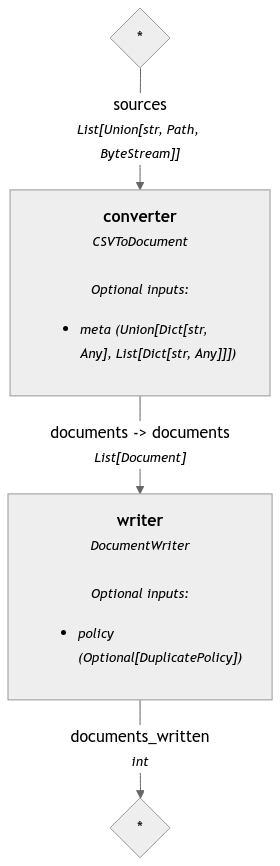

In [23]:
pipeline.show()

In [4]:
from haystack.components.retrievers.in_memory import InMemoryBM25Retriever, InMemoryEmbeddingRetriever
from haystack import Pipeline
from haystack.utils import ComponentDevice
from haystack.components.embedders import SentenceTransformersTextEmbedder
from haystack.components.joiners import DocumentJoiner
from haystack.components.rankers import TransformersSimilarityRanker

def hybrid_retrieval_pipeline(embedding_model: str, document_store, top_k=2):
    text_embedder = SentenceTransformersTextEmbedder(
        model=embedding_model, device=ComponentDevice.from_str("cuda:0")
    )
    embedding_retriever = InMemoryEmbeddingRetriever(document_store, top_k=top_k)
    bm25_retriever = InMemoryBM25Retriever(document_store)
    
    document_joiner = DocumentJoiner()
    
    ranker = TransformersSimilarityRanker(model="BAAI/bge-reranker-base")
    
    hybrid_retrieval = Pipeline()
    hybrid_retrieval.add_component("text_embedder", text_embedder)
    hybrid_retrieval.add_component("embedding_retriever", embedding_retriever)
    hybrid_retrieval.add_component("bm25_retriever", bm25_retriever)
    hybrid_retrieval.add_component("document_joiner", document_joiner)
    hybrid_retrieval.add_component("ranker", ranker)
    
    hybrid_retrieval.connect("text_embedder", "embedding_retriever")
    hybrid_retrieval.connect("bm25_retriever", "document_joiner")
    hybrid_retrieval.connect("embedding_retriever", "document_joiner")
    hybrid_retrieval.connect("document_joiner", "ranker")

    return hybrid_retrieval

In [5]:
def pretty_print_results(prediction):
    for doc in prediction["documents"]:
        print("------------------------------------------------------------------------------")
        print("Title : ", doc.meta["title"], "\t", doc.score)
        print("Abstract :", doc.content[:250])
        print("Authors : ", doc.meta["authors"])
        print("Published On : ", doc.meta["pub_date"])
        print("\n", "\n")
        print("------------------------------------------------------------------------------")

## 📦 Model 1 : all-mpnet-base-v2 (Baseline)

In [9]:
doc_store = indexing("sentence-transformers/all-mpnet-base-v2", 512)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/9393 [00:00<?, ?it/s]

## 🧪 Manual Evaluation : all-mpnet-base-v2 (Baseline)

Model : `all-mpnet-base-v2` (Baseline)

In [10]:
doc_store.save_to_disk("/kaggle/working/document-store-all-mpnet-base-v2.json")

In [5]:
from haystack.document_stores.in_memory import InMemoryDocumentStore
doc_store = InMemoryDocumentStore(embedding_similarity_function="cosine")
doc_store = doc_store.load_from_disk("/kaggle/working/document-store-all-mpnet-base-v2.json")

In [7]:
hybrid_retrieval = hybrid_retrieval_pipeline("sentence-transformers/all-mpnet-base-v2", doc_store, top_k=4)

In [9]:
query = "How do the performance levels of ChatGPT3.5, ChatGPT4, and ChatGPT4o-mini compare on a statistics exam?"

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/799 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.11G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/443 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.1M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/279 [00:00<?, ?B/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Generative AI Takes a Statistics Exam: A Comparison of Performance
  between ChatGPT3.5, ChatGPT4, and ChatGPT4o-mini 	 0.9992882609367371
Abstract : Many believe that use of generative AI as a private tutor has the potential
to shrink access and achievement gaps between students and schools with
abundant resources versus those with fewer resources. Shrinking the gap is
possible only if paid and f
Authors :  Monnie McGee, Bivin Sadler
Published On :  2025-01-15T21:46:01Z

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Equity in the Use of ChatGPT for the Classroom: A Comparison of the
  Accuracy and Precision of ChatGPT 3.5 vs. ChatGPT4 with Respect to Statistics
  and Data Science Exams 	 0.5634739398956299
Abstract : A college education historically has been seen as method of 

In [10]:
query = "Can paid and free versions of generative AI platforms perform with the same accuracy?"

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Generative AI Takes a Statistics Exam: A Comparison of Performance
  between ChatGPT3.5, ChatGPT4, and ChatGPT4o-mini 	 0.9913923740386963
Abstract : Many believe that use of generative AI as a private tutor has the potential
to shrink access and achievement gaps between students and schools with
abundant resources versus those with fewer resources. Shrinking the gap is
possible only if paid and f
Authors :  Monnie McGee, Bivin Sadler
Published On :  2025-01-15T21:46:01Z

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Equity in the Use of ChatGPT for the Classroom: A Comparison of the
  Accuracy and Precision of ChatGPT 3.5 vs. ChatGPT4 with Respect to Statistics
  and Data Science Exams 	 0.8272597193717957
Abstract : A college education historically has been seen as method of 

Keyword based search

In [7]:
## original query
query = "deep learning"

hybrid_retrieval = hybrid_retrieval_pipeline("sentence-transformers/all-mpnet-base-v2", doc_store, top_k=4)

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/571 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/438M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/799 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.11G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/443 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.1M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/279 [00:00<?, ?B/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Title :  Deep Learning Essentials: Your hands-on guide to the fundamentals of deep learning and neural network modeling 	 0.9977222084999084
Authors :  [{'name': 'Wei  Di', 'ids': ['144581172']}, {'name': 'Anurag  Bhardwaj', 'ids': ['1709243']}, {'name': 'Jianing  Wei', 'ids': ['47807303']}]
Published On :  2018

 

Title :  A primer on deep learning in genomics 	 0.9972366094589233
Authors :  [{'name': 'James  Zou', 'ids': ['145085305']}, {'name': 'Mikael  Huss', 'ids': ['50104183']}, {'name': 'Abubakar  Abid', 'ids': ['144948925']}, {'name': 'Pejman  Mohammadi', 'ids': ['49095215']}, {'name': 'Ali  Torkamani', 'ids': ['3286188']}, {'name': 'Amalio  Telenti', 'ids': ['2969256']}]
Published On :  2018

 

Title :  Genetic Evolutionary Network ModelSampled Sub-Networks Learning Results Output Result ... Step 1 : Network Sampling Step 2 : Sub-Network Representation Learning Step 3 : Result Ensemble 	 0.9950199127197266
Authors :  [{'name': 'Jiawei  Zhang', 'ids': ['1718428']}, {'name': '

In [11]:
query = "deep learning"

hybrid_retrieval = hybrid_retrieval_pipeline("sentence-transformers/all-mpnet-base-v2", doc_store, top_k=4)

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Deep Learning Essentials: Your hands-on guide to the fundamentals of deep learning and neural network modeling 	 0.9977222084999084
Abstract : Get to grips with the essentials of deep learning by leveraging the power of Python Key Features Your one-stop solution to get started with the essentials of deep learning and neural network modelingTrain different kinds of neural networks to tackle 
Authors :  [{'name': 'Wei  Di', 'ids': ['144581172']}, {'name': 'Anurag  Bhardwaj', 'ids': ['1709243']}, {'name': 'Jianing  Wei', 'ids': ['47807303']}]
Published On :  2018

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  A primer on deep learning in genomics 	 0.9972366094589233
Abstract : Deep learning methods are a class of machine learning techniques capable of identifying highly complex p

Full-Text search

In [7]:
query = "Deep learning algorithms have received significant attention in the last few years."

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  FPGA-Accelerated Hadoop Cluster for Deep Learning Computations 	 0.9998849630355835
Abstract : Deep learning algorithms have received significant attention in the last few years. Their popularity is due to their ability to achieve higher accuracy than conventional machine learning in many research areas such as speech recognition, image proces
Authors :  [{'name': 'Abdulrahman  Alhamali', 'ids': ['2234763']}, {'name': 'Nibal  Salha', 'ids': ['2945376']}, {'name': 'Raghid  Morcel', 'ids': ['2335685']}, {'name': 'Mazen  Ezzeddine', 'ids': ['2955317']}, {'name': 'Omar  Hamdan', 'ids': ['2025243']}, {'name': 'Haitham  Akkary', 'ids': ['2971885']}, {'name': 'Hazem M. Hajj', 'ids': ['145336745']}]
Published On :  2015

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Semantic Constraint

Question

In [7]:
query = "What is Corona Virus ?"

hybrid_retrieval = hybrid_retrieval_pipeline("sentence-transformers/all-mpnet-base-v2", doc_store, top_k=4)

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Coronavirus: A new threat to pilgrims 	 0.031202983111143112
Abstract : The period between November 2012 and July 2013 marked the pandemic of severe acute respiratory syndrome coronavirus (SARS CoV) that killed around 775 people in 2003. Recently, a new strain of coronavirus, novel coronavirus (London1 novel CoV), has be
Authors :  [{'name': 'Kanwal  Abro', 'ids': ['14073289']}, {'name': 'Marium  Farooqi', 'ids': ['34811400']}, {'name': 'Sajid  Ali', 'ids': ['47495965']}, {'name': 'Syed Arsalan Ali', 'ids': ['4419738']}]
Published On :  2015

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Propagation of n-cov cases in india from january to june 2020 	 0.008276676759123802
Abstract : This review gives an overview on the propagation of n-CoV cases in India since January 2020 to ti

In [12]:
query = "What are some of the latest advancements in NLP ?"

#hybrid_retrieval = hybrid_retrieval_pipeline("sentence-transformers/all-mpnet-base-v2", doc_store, top_k=4)

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Comparative Study of CNN and RNN for Natural Language Processing 	 0.15191242098808289
Abstract : Deep neural networks (DNN) have revolutionized the field of natural language processing (NLP). Convolutional neural network (CNN) and recurrent neural network (RNN), the two main types of DNN architectures, are widely explored to handle various NLP t
Authors :  [{'name': 'Wenpeng  Yin', 'ids': ['40483594']}, {'name': 'Katharina  Kann', 'ids': ['3422953']}, {'name': 'Mo  Yu', 'ids': ['2482533']}, {'name': 'Hinrich  Schütze', 'ids': ['144418438']}]
Published On :  2017

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Automatic Text Analysis Using Drupal 	 0.11269690841436386
Abstract : Natural language processing (NLP) is a field of computer science that is concerned with the interpret

Topic Search

In [13]:
query = "machine learning algorithms"

#hybrid_retrieval = hybrid_retrieval_pipeline("sentence-transformers/all-mpnet-base-v2", doc_store, top_k=4)

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Adaptable Realization of Industrial Analytics Functions on Edge-Devices using Reconfigurable Architectures 	 0.9992115497589111
Abstract : Machine learning algorithms play a significant role for the realization of industrial analytics functions, such as predictive maintenance. This paper first outlines the workflow and topology variants for industrial analytics, and then focuses on the 
Authors :  [{'name': 'Carlos Paiz Gatica', 'ids': ['8430660']}, {'name': 'Marco  Platzner', 'ids': ['1947535']}]
Published On :  2017

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Quantum machine learning 	 0.9986625909805298
Abstract : Machine learning techniques are applied for solving a large variety of practical problems. The tasks attacked by machine learning algorithms include classificat

## 📦 Model 2: intfloat/e5-small-v2

In [ ]:
document_store = indexing("intfloat/e5-small-v2", 128)

In [10]:
!xz -d -v -f -c '/kaggle/input/e5-small-v2/document_store.json.lzma' > '/kaggle/working/document_store.json'

/kaggle/input/e5-small-v2/document_store.json.lzma (1/1)
  100 %   1,021.0 MiB / 2,904.2 MiB = 0.352    44 MiB/s       1:06             


In [3]:
from haystack.document_stores.in_memory import InMemoryDocumentStore
document_store = InMemoryDocumentStore(embedding_similarity_function="cosine")
document_store = document_store.load_from_disk("/kaggle/working/document_store.json")

## 🧪 Manual Evaluation

Model : `intfloat/e5-small-v2`

In [9]:
hybrid_retrieval = hybrid_retrieval_pipeline("intfloat/e5-small-v2", document_store, top_k=4)

In [10]:
query = "How do the performance levels of ChatGPT3.5, ChatGPT4, and ChatGPT4o-mini compare on a statistics exam?"

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

modules.json:   0%|          | 0.00/387 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/67.8k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/57.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/615 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/133M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/314 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/200 [00:00<?, ?B/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Generative AI Takes a Statistics Exam: A Comparison of Performance
  between ChatGPT3.5, ChatGPT4, and ChatGPT4o-mini 	 0.9992882609367371
Abstract : Many believe that use of generative AI as a private tutor has the potential
to shrink access and achievement gaps between students and schools with
abundant resources versus those with fewer resources. Shrinking the gap is
possible only if paid and f
Authors :  Monnie McGee, Bivin Sadler
Published On :  2025-01-15T21:46:01Z

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Equity in the Use of ChatGPT for the Classroom: A Comparison of the
  Accuracy and Precision of ChatGPT 3.5 vs. ChatGPT4 with Respect to Statistics
  and Data Science Exams 	 0.5634739398956299
Abstract : A college education historically has been seen as method of 

In [11]:
query = "Can paid and free versions of generative AI platforms perform with the same accuracy?"

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Generative AI Takes a Statistics Exam: A Comparison of Performance
  between ChatGPT3.5, ChatGPT4, and ChatGPT4o-mini 	 0.9913923740386963
Abstract : Many believe that use of generative AI as a private tutor has the potential
to shrink access and achievement gaps between students and schools with
abundant resources versus those with fewer resources. Shrinking the gap is
possible only if paid and f
Authors :  Monnie McGee, Bivin Sadler
Published On :  2025-01-15T21:46:01Z

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Equity in the Use of ChatGPT for the Classroom: A Comparison of the
  Accuracy and Precision of ChatGPT 3.5 vs. ChatGPT4 with Respect to Statistics
  and Data Science Exams 	 0.8272597193717957
Abstract : A college education historically has been seen as method of 

In [11]:
query = "deep learning"

hybrid_retrieval = hybrid_retrieval_pipeline(document_store, top_k=4)

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/94.8k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/52.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/133M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/366 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/799 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.11G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/443 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.1M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/279 [00:00<?, ?B/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Title :  Deep Learning Essentials: Your hands-on guide to the fundamentals of deep learning and neural network modeling 	 0.9977222084999084
Authors :  [{'name': 'Wei  Di', 'ids': ['144581172']}, {'name': 'Anurag  Bhardwaj', 'ids': ['1709243']}, {'name': 'Jianing  Wei', 'ids': ['47807303']}]
Published On :  2018

 

Title :  A primer on deep learning in genomics 	 0.9972366094589233
Authors :  [{'name': 'James  Zou', 'ids': ['145085305']}, {'name': 'Mikael  Huss', 'ids': ['50104183']}, {'name': 'Abubakar  Abid', 'ids': ['144948925']}, {'name': 'Pejman  Mohammadi', 'ids': ['49095215']}, {'name': 'Ali  Torkamani', 'ids': ['3286188']}, {'name': 'Amalio  Telenti', 'ids': ['2969256']}]
Published On :  2018

 

Title :  Genetic Evolutionary Network ModelSampled Sub-Networks Learning Results Output Result ... Step 1 : Network Sampling Step 2 : Sub-Network Representation Learning Step 3 : Result Ensemble 	 0.9950199127197266
Authors :  [{'name': 'Jiawei  Zhang', 'ids': ['1718428']}, {'name': '

In [12]:
query = "What are the latest advancements in natural language processing?"

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Title :  Technologies, implementations and applications for the Kleistian development of thoughts in speech 	 0.18472981452941895
Authors :  [{'name': 'O.  Arnold', 'ids': ['30162886']}, {'name': 'A.  Schulz', 'ids': ['48406400']}]
Published On :  2012

 

Title :  Computational Linguistics: Introduction to the Thematic Issue 	 0.05008715018630028
Authors :  [{'name': 'Alexander  Gelbukh', 'ids': ['1381961498']}]
Published On :  2019

 

Title :  Insight of Various Pos Tagging Techniques for Hindi Language 	 0.04367292299866676
Authors :  [{'name': 'Simpal  Jain', 'ids': ['66320054']}, {'name': 'Nidhi Mishra Simpal Jain', 'ids': ['50399749']}, {'name': 'N. C. Mishra', 'ids': ['36298676']}]
Published On :  2017

 

Title :  Research on the Optimizing Method of Question Answering System in Natural Language Processing 	 0.00969894602894783
Authors :  [{'name': 'Kunpeng  Zhang', 'ids': ['2737830']}]
Published On :  2019

 

Title :  A Novel Approach For Syntactic Similarity Between Two Sho

In [13]:
query = "machine learning algorithms"

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Title :  Adaptable Realization of Industrial Analytics Functions on Edge-Devices using Reconfigurable Architectures 	 0.9992115497589111
Authors :  [{'name': 'Carlos Paiz Gatica', 'ids': ['8430660']}, {'name': 'Marco  Platzner', 'ids': ['1947535']}]
Published On :  2017

 

Title :  Quantum machine learning 	 0.9986625909805298
Authors :  [{'name': 'Ievgeniia  Oshurko', 'ids': ['25106284']}]
Published On :  2016

 

Title :  A Comparison of First-order Algorithms for Machine Learning 	 0.9962925314903259
Authors :  Yu Wei, Pock Thomas
Published On :  2014-04-26T19:24:24Z

 

Title :  A new boosting algorithm based on dual averaging scheme 	 0.9920233488082886
Authors :  Nan Wang
Published On :  2015-07-11T16:46:37Z

 

Title :  Performance Evaluation of Machine Learning Algorithms in Post-operative
  Life Expectancy in the Lung Cancer Patients 	 0.9779168367385864
Authors :  Kwetishe Joro Danjuma
Published On :  2015-04-17T22:05:34Z

 

Title :  A study on machine learning web service 

## 📦 Model 3 : msmarco-distilroberta-base-v2

In [9]:
doc_store_roberta = indexing("sentence-transformers/msmarco-distilroberta-base-v2", 128)

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/3.76k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/683 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/328M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/1.20k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/772 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/9393 [00:00<?, ?it/s]

Time taken : 1h 6m 10s  
Inference Speed : 10.39 it/s

In [12]:
doc_store_roberta.save_to_disk("/kaggle/working/document-store-msmarco-distilroberta-base-v2.json")

In [ ]:
from haystack.document_stores.in_memory import InMemoryDocumentStore
doc_store_roberta = InMemoryDocumentStore(embedding_similarity_function="cosine")
doc_store_roberta = doc_store_roberta.load_from_disk("/kaggle/working/document-store-msmarco-distilroberta-base-v2.json")

In [10]:
hybrid_retrieval = hybrid_retrieval_pipeline("sentence-transformers/msmarco-distilroberta-base-v2", doc_store_roberta, top_k=3)

## 🧪 Manual Evaluation

**Broad term search**

In [11]:
query = "machine learning algorithms"


result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

config.json:   0%|          | 0.00/799 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.11G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/443 [00:00<?, ?B/s]

sentencepiece.bpe.model:   0%|          | 0.00/5.07M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.1M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/279 [00:00<?, ?B/s]

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Adaptable Realization of Industrial Analytics Functions on Edge-Devices using Reconfigurable Architectures 	 0.9992115497589111
Abstract : Machine learning algorithms play a significant role for the realization of industrial analytics functions, such as predictive maintenance. This paper first outlines the workflow and topology variants for industrial analytics, and then focuses on the 
Authors :  [{'name': 'Carlos Paiz Gatica', 'ids': ['8430660']}, {'name': 'Marco  Platzner', 'ids': ['1947535']}]
Published On :  2017

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Quantum machine learning 	 0.9986625909805298
Abstract : Machine learning techniques are applied for solving a large variety of practical problems. The tasks attacked by machine learning algorithms include classificat

In [13]:
query = "deep learning"


result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Deep Learning in Proteomics Informatics: Applications, Challenges, and
  Future Directions 	 0.9997617602348328
Abstract : Deep learning is an advanced technology that relies on large-scale data and
complex models for feature extraction and pattern recognition. It has been
widely applied across various fields, including computer vision, natural
language processing, and s
Authors :  Yindan Luo, Jiaxin Cai
Published On :  2024-12-23T07:21:27Z

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Deep Learning Essentials: Your hands-on guide to the fundamentals of deep learning and neural network modeling 	 0.9977222084999084
Abstract : Get to grips with the essentials of deep learning by leveraging the power of Python Key Features Your one-stop solution to get started with the essential

In [14]:
query = "what are some recent advancements in deep learning ?"


result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  Compressing Deep Neural Networks: A New Hashing Pipeline Using Kac's
  Random Walk Matrices 	 0.9625767469406128
Abstract : The popularity of deep learning is increasing by the day. However, despite
the recent advancements in hardware, deep neural networks remain
computationally intensive. Recent work has shown that by preserving the angular
distance between vectors, rand
Authors :  Jack Parker-Holder, Sam Gass
Published On :  2018-01-09T02:40:12Z

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Deep Learning on Mobile Devices - A Review 	 0.9564132690429688
Abstract : Recent breakthroughs in deep learning and artificial intelligence
technologies have enabled numerous mobile applications. While traditional
computation paradigms rely on mobile sensing and cloud computing, deep lea

In [15]:
query = "Impact of protein in muscle growth"


result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

------------------------------------------------------------------------------
Title :  The Role of Dietary Protein Intake and Resistance Training on Myosin Heavy Chain Expression 	 0.7097161412239075
Abstract : During resistance training the muscle undergoes many changes. Possibly the most profound and significant changes are those that occur in the muscles contractile proteins. Increases in these contractile proteins are one of the primary factors contribu
Authors :  [{'name': 'Colin D Wilborn', 'ids': ['5031930']}, {'name': 'Darryn S Willoughby', 'ids': ['145351801']}]
Published On :  2004

 

------------------------------------------------------------------------------
------------------------------------------------------------------------------
Title :  Effects of different levels of protein intake and physical training on growth and nutritional status of young rats. 	 0.6301311254501343
Abstract : This study aimed to investigate the effects of physical training, and different l

## 🏆 Conclusion

As we saw the responses on sample queries related to the topic on ChatGPT's performance and whether it can be useful in education field, where there were only 2 relevant documents in the dataset and all the models could retrieve them with decent scores. One question where it couldn't perform well and rather retrieved documents with keywords or similar text from query is when asked for the latest advancements in NLP - which suggests that the query explicitly needs temporal context to give better results or queries require being embedded in a slightly different way to improve results

There's a trade-off between precision and recall which is a common phenomenon in information retrieval, and it's often referred to as the "precision-recall trade-off".

By adjusting the value of `top_k`, we can control the balance between precision and recall.

Here are some other qualitative aspects of the output response that can be observed:

**Relevance of top-ranked documents**: The top-ranked documents (with scores 0.999 and 0.563) appear to be highly relevant to the search query, as they are directly related to the topic of generative AI and statistics.  
**Irrelevance of lower-ranked documents**: The lower-ranked documents (with scores close to 0) appear to be largely irrelevant to the search query, as they are related to unrelated topics such as web applications, batch normalization, and laboratory examinations.  
**Score distribution**: The scores of the retrieved documents are highly skewed, with the top-ranked documents having scores that are several orders of magnitude higher than the lower-ranked documents. This suggests that the retriever is able to effectively distinguish between highly relevant and less relevant documents.  
**Lack of relevant documents**: Despite the retriever returning 10 documents, only 2 of them are actually relevant to the search query. This suggests that the retriever may not have been able to find all the relevant documents in the collection, or that the collection may not contain many relevant documents.


**Model Performance**:

The e5-small-v2 and the msmarco-distilroberta-base-v2 embedding models outperform the baseline all-mpnet-base-v2 in terms of inferencing speed by 2 times  
The msmarco-distilroberta-base-v2 is known to have less variance in scores, indicating that this model is more stable to `top_k` and `chunk_size` parameter variations than the other models

In [9]:
result

{'ranker': {'documents': []}}

In [27]:
pretty_print_results(result["ranker"])

In [32]:
query = "hierarchical reinforcement"

hybrid_retrieval = hybrid_retrieval_pipeline(document_store, top_k=4)

result = hybrid_retrieval.run(
    {"text_embedder": {"text": query}, "bm25_retriever": {"query": query}, "ranker": {"query": query}}
)

pretty_print_results(result["ranker"])

Batches:   0%|          | 0/1 [00:00<?, ?it/s]

Generating Adjacency-Constrained Subgoals in Hierarchical Reinforcement Learning 	 0.9985535740852356
[{'name': 'Tianren  Zhang', 'ids': ['12690125']}, {'name': 'Shangqi  Guo', 'ids': ['51066025']}, {'name': 'Tian  Tan', 'ids': ['2429349']}, {'name': 'Xiaolin  Hu', 'ids': ['145460910']}, {'name': 'Feng  Chen', 'ids': ['40102249']}]

 

State Abstraction in MAXQ Hierarchical Reinforcement Learning 	 0.9115143418312073
Thomas G. Dietterich

 

Hierarchical Reinforcement Learning with the MAXQ Value Function
  Decomposition 	 0.8988816738128662
Thomas G. Dietterich

 

Hierarchical Markov decision process based on DEVS formalism 	 0.8495427966117859
[{'name': 'Celine  Kessler', 'ids': ['31645892']}, {'name': 'Laurent  Capocchi', 'ids': ['2998351']}, {'name': 'Jean François Santucci', 'ids': ['73134812']}, {'name': 'Bernard P. Zeigler', 'ids': ['1755591']}]

 

Model-based learning with Bayesian and MAXQ value function decomposition for hierarchical task 	 0.7124298810958862
[{'name': 'Zha

In [ ]:
intfloat/e5-small-v2

In [ ]:
from haystack import Pipeline
from haystack.components.evaluators import ContextRelevanceEvaluator, FaithfulnessEvaluator, SASEvaluator

def evaluation(questions, answers, retrieved_contexts, predicted_answers, embedding_model):
    eval_pipeline = Pipeline()
    eval_pipeline.add_component("context_relevance", ContextRelevanceEvaluator(raise_on_failure=False))
    eval_pipeline.add_component("faithfulness", FaithfulnessEvaluator(raise_on_failure=False))
    eval_pipeline.add_component("sas", SASEvaluator(model=embedding_model))

    eval_pipeline_results = eval_pipeline.run(
        {
            "context_relevance": {"questions": questions, "contexts": retrieved_contexts},
            "faithfulness": {"questions": questions, "contexts": retrieved_contexts, "predicted_answers": predicted_answers},
            "sas": {"predicted_answers": predicted_answers, "ground_truth_answers": answers},
        }
    )

    results = {
        "context_relevance": eval_pipeline_results['context_relevance'],
        "faithfulness": eval_pipeline_results['faithfulness'],
        "sas": eval_pipeline_results['sas']
    }

		inputs = {
				'questions': sample_questions,
        'contexts': retrieved_contexts,
        'true_answers': sample_answers,
        'predicted_answers': predicted_answers
     }

    return results, inputs

In [ ]:
futures[0].result()

In [ ]:
df_combined['Title'].iloc[1:5].tolist()

In [1]:
import os
os.chdir('/kaggle/working')
!pwd

/kaggle/working


In [2]:
!xz --format=lzma -k ./document-store-msmarco-distilroberta-base-v2.json --verbose

./document-store-msmarco-distilroberta-base-v2.json (1/1)
  100 %   1,695.4 MiB / 5,108.3 MiB = 0.332   1.1 MiB/s    1:16:09             


In [ ]:
!ls -la /kaggle/working/document-store-*

In [1]:
!rm /kaggle/working/document-store-msmarco-distilroberta-base-v2.json.lzma

In [ ]:
len(abstract_embeddings)

In [ ]:
!ls -la '/kaggle/working/abstract_embeddings1.pkl.xz'

In [ ]:
import lzma
import pickle

with lzma.open('abstract_embeddings1.pkl.xz', 'wb') as f:
    pickle.dump(abstract_embeddings, f)

In [ ]:
with lzma.open('abstract_embeddings1.pkl.xz', 'rb') as f:
    abstract_embeddings = pickle.load(f)

In [ ]:
abstract_embeds_only = [emb[1].cpu().numpy() for emb in abstract_embeddings if emb[1] is not None]
abstract_df = pd.DataFrame({
    'Abstract_Embeddings': abstract_embeds_only
})
abstract_df.to_csv('abstract_embeds_output_subset9.csv', index=False)

In [ ]:
import numpy as np

# Extract the embeddings from the abstract_embeddings list
abstract_embeds_only = [emb[1].cpu().numpy() for emb in abstract_embeddings if emb[1] is not None]

# Convert the list of embeddings to a NumPy array
abstract_embeds_array = np.array(abstract_embeds_only)

# Save the array to a .npy file
np.save('abstract_embeds_output1.npy', abstract_embeds_array)

In [ ]:
import pyarrow as pa
import pyarrow.feather as feather

# Define desired size for padding/truncating
desired_size = 768  # Example size for BERT embeddings

# Pad or truncate each embedding and create a new list with uniform shape
padded_embeddings = []
for emb in abstract_embeds_only:
    if len(emb) < desired_size:
        padded_embedding = np.pad(emb, (0, desired_size - len(emb)), 'constant')
    else:
        padded_embedding = emb[:desired_size]
    padded_embeddings.append(padded_embedding)

# Convert list of padded embeddings to DataFrame
padded_embeddings_array = np.array(padded_embeddings)
padded_embeddings_df = pd.DataFrame(padded_embeddings_array)

# Save to an Arrow (Feather) file
padded_embeddings_df.to_feather('abstract_embeds_output1.arrow')

In [ ]:
del abstract_embeddings

In [ ]:
gc.collect()

In [ ]:
print(torch.cuda.memory_allocated()) # Current allocated GPU memory
print(torch.cuda.memory_reserved()) # Total reserved GPU memory

In [ ]:
type(title_embeddings)

In [ ]:
title_embeds_only = [emb[1].cpu().numpy() for emb in title_embeddings if emb[1] is not None]
embedding_df = pd.DataFrame({
    'Title_Embeddings': title_embeds_only
})
embedding_df.to_csv('embeddings_output.csv', index=False)

In [ ]:
## Remove later
title_processed = df_combined['Title'].apply(lambda x: process_text(x))